#                                             Lending Club Case Study

### Problem Statement
This **Company** is the largest **online loan marketplace, facilitating personal loans, business loans, and financing of medical procedures**. Borrowers can easily access lower interest rate loans through a fast online interface. Like most other lending companies, lending loans to **‘risky’** applicants is the largest source of **financial loss (called credit loss)**. **Credit loss** is the amount of money lost by the lender when the borrower refuses to pay or runs away with the money owed. In other words, borrowers who default cause the largest amount of loss to the lenders. In this case, the customers labelled as **'charged-off'** are the **'defaulters'**. 

If one is able to identify these **risky loan applicants**, then such loans can be reduced thereby cutting down the amount of **credit loss**. 

### Goal
Utilize **Exploratory Data Analysis(EDA)** to determine which types of **customers** are likely to **default on a loan**. By identifying the driving factors behind loan defaults to **reduce credit loss effectively**.


##  Steps to achieve the Goal
 1. Data Sourcing
 2. Data Inspection
 3. Data Cleaning
 4. Data Visualization and Analysis
 5. Insights and observations

## 1. Loading given data (Data Sourcing)

In [1]:
# Importing required libraries
# Data manipulation libraries
import pandas as pd
import numpy as np 

# Data visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px 

# Warnings library to supress warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Loading the given data by using Panda library's read method
loan_dataFrame = pd.read_csv('loan.csv')

## 2. Understanding given data (Data Inspection)

In [3]:
# Displaying the first 5 rows of the DataFrame
print(loan_dataFrame.head())

        id  member_id  loan_amnt  funded_amnt  funded_amnt_inv        term  \
0  1077501    1296599       5000         5000           4975.0   36 months   
1  1077430    1314167       2500         2500           2500.0   60 months   
2  1077175    1313524       2400         2400           2400.0   36 months   
3  1076863    1277178      10000        10000          10000.0   36 months   
4  1075358    1311748       3000         3000           3000.0   60 months   

  int_rate  installment grade sub_grade  ... num_tl_90g_dpd_24m  \
0   10.65%       162.87     B        B2  ...                NaN   
1   15.27%        59.83     C        C4  ...                NaN   
2   15.96%        84.33     C        C5  ...                NaN   
3   13.49%       339.31     C        C1  ...                NaN   
4   12.69%        67.79     B        B5  ...                NaN   

  num_tl_op_past_12m pct_tl_nvr_dlq  percent_bc_gt_75 pub_rec_bankruptcies  \
0                NaN            NaN               

In [4]:
# Displaying a concise summary of the DataFrame
print(loan_dataFrame.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB
None


In [5]:
# Describing the dataframe (describe provides statistical summary of the numerical columns in the dataframe)
print(loan_dataFrame.describe())

                 id     member_id     loan_amnt   funded_amnt  \
count  3.971700e+04  3.971700e+04  39717.000000  39717.000000   
mean   6.831319e+05  8.504636e+05  11219.443815  10947.713196   
std    2.106941e+05  2.656783e+05   7456.670694   7187.238670   
min    5.473400e+04  7.069900e+04    500.000000    500.000000   
25%    5.162210e+05  6.667800e+05   5500.000000   5400.000000   
50%    6.656650e+05  8.508120e+05  10000.000000   9600.000000   
75%    8.377550e+05  1.047339e+06  15000.000000  15000.000000   
max    1.077501e+06  1.314167e+06  35000.000000  35000.000000   

       funded_amnt_inv   installment    annual_inc           dti  \
count     39717.000000  39717.000000  3.971700e+04  39717.000000   
mean      10397.448868    324.561922  6.896893e+04     13.315130   
std        7128.450439    208.874874  6.379377e+04      6.678594   
min           0.000000     15.690000  4.000000e+03      0.000000   
25%        5000.000000    167.020000  4.040400e+04      8.170000   
50%   

In [6]:
# Displaying Data types of each column
print(loan_dataFrame.dtypes)

id                              int64
member_id                       int64
loan_amnt                       int64
funded_amnt                     int64
funded_amnt_inv               float64
                               ...   
tax_liens                     float64
tot_hi_cred_lim               float64
total_bal_ex_mort             float64
total_bc_limit                float64
total_il_high_credit_limit    float64
Length: 111, dtype: object


In [7]:
# Displaying the columns in the dataframe
print(loan_dataFrame.columns)

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       ...
       'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
       'percent_bc_gt_75', 'pub_rec_bankruptcies', 'tax_liens',
       'tot_hi_cred_lim', 'total_bal_ex_mort', 'total_bc_limit',
       'total_il_high_credit_limit'],
      dtype='object', length=111)


## 3. Performing Data Cleaning activities(Data Cleaning)

### Handle Missing Values

In [8]:
# Count the number of missing (null or NaN) values in each column for the dataframe.
print(loan_dataFrame.isnull().sum())

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64


In [9]:
# Displaying column and Percentage of missing values for each column having missing values and the number of columns

# Only Columns with missing (null or NaN) values in the dataframe.
null_columns = loan_dataFrame.columns[loan_dataFrame.isnull().any()]

# Calculate sum of null values for each column containing null values
null_counts = loan_dataFrame[null_columns].isnull().sum()

total_rows = len(loan_dataFrame)
null_percentages = (null_counts / total_rows) * 100
print("\nPercentage of missing values for each column:")
print(null_percentages)

# Displaying the number of Columns with missing (null or NaN) values >=50 in the dataframe.
print("\n Total number of columns having missing values >= 50 :")
print(len(null_percentages[null_percentages >= 50]))


Percentage of missing values for each column:
emp_title                       6.191303
emp_length                      2.706650
desc                           32.585543
title                           0.027696
mths_since_last_delinq         64.662487
                                 ...    
tax_liens                       0.098195
tot_hi_cred_lim               100.000000
total_bal_ex_mort             100.000000
total_bc_limit                100.000000
total_il_high_credit_limit    100.000000
Length: 68, dtype: float64

 Total number of columns having missing values >= 50 :
57


In [10]:
# As we have a lot of columns with equal to or more than 50% missing value.
# we should remove them as high percentage of missing data may not contribute meaningful information to our analysis.
columns_to_drop = null_percentages[null_percentages >= 50].index

# Shape of the dataframe before removing the columns
print("\n Shape of the dataframe before removing the columns :")
print(loan_dataFrame.shape)

# Drop columns from DataFrame
loan_dataFrame = loan_dataFrame.drop(columns=columns_to_drop)

# Shape of the dataframe after removing the columns 
print("\n Shape of the dataframe after removing the columns :")
print(loan_dataFrame.shape)


 Shape of the dataframe before removing the columns :
(39717, 111)

 Shape of the dataframe after removing the columns :
(39717, 54)


In [11]:
# Now lets Count the number of missing values in across the rows
missing_values_per_row = loan_dataFrame.isnull().sum(axis=1).max()

print((missing_values_per_row))

6


### As we can see that the missing values in rows are not high we don't have to remove them.

In [12]:
# Now lets check column with unique value with default sort "ascending"
unique_value_counts = loan_dataFrame.nunique().sort_values()
print(unique_value_counts)

tax_liens                         1
delinq_amnt                       1
chargeoff_within_12_mths          1
acc_now_delinq                    1
application_type                  1
policy_code                       1
initial_list_status               1
collections_12_mths_ex_med        1
pymnt_plan                        1
term                              2
pub_rec_bankruptcies              3
verification_status               3
loan_status                       3
pub_rec                           5
home_ownership                    5
grade                             7
inq_last_6mths                    9
emp_length                       11
delinq_2yrs                      11
purpose                          14
sub_grade                        35
open_acc                         40
addr_state                       50
issue_d                          55
total_acc                        82
last_pymnt_d                    101
last_credit_pull_d              106
int_rate                    

In [13]:
# As we can see there are many columns which are having single unique value. we can remove those columns.
# As Columns with a single unique value across all rows are generally not relevant for analysis. 

# Identify columns with only one unique value
single_unique_value_columns = unique_value_counts[unique_value_counts == 1].index

print("\n Shape of the dataframe before removing the columns :")
print(loan_dataFrame.shape)
# Drop columns with only one unique value from the DataFrame
loan_dataFrame = loan_dataFrame.drop(columns=single_unique_value_columns)

print("\n Shape of the dataframe before after the columns :")
print(loan_dataFrame.shape)


 Shape of the dataframe before removing the columns :
(39717, 54)

 Shape of the dataframe before after the columns :
(39717, 45)


In [14]:
# Columns in the dataframe
print(loan_dataFrame.columns)

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'pub_rec_bankruptcies'],
      dtype='object')


### Now we will check for any irrelevant columns which we don't require for our Analysis and remove them


### 1. Removing below as they are unique identifier for each row and does not provide any informative value about the data itself
- id
- member_id

### 2. Removing below as they are typically free-text entries with high variability and not standardized.
- emp_title
- title

### 3. Removing below as URLs are links to web resources and do not contain intrinsic information useful for analysis.
- url
 
### 4. Removing below as this is lengthy text field that contain unstructured data
- desc

### 5. Removing below as this is having masked data and not relevant for out analysis
- zip_code

### 6. Other columns - we don't require the below columns as these columns are for after loan approval process.
- delinq_2yrs
- pub_rec
- revol_bal
- out_prncp
- out_prncp_inv
- total_pymnt
- total_pymnt_inv
- total_rec_prncp
- total_rec_int
- total_rec_late_fee
- recoveries
- collection_recovery_fee
- last_pymnt_d
- last_pymnt_amnt
- last_credit_pull_d
- funded_amnt_inv
- earliest_cr_line

In [15]:
#Removing the above irrelevant columns

print("\n Shape of the dataframe before removing the columns :")
print(loan_dataFrame.shape)

loan_dataFrame=loan_dataFrame.drop(['id', 'member_id', 'emp_title', 'title', 'url', 'desc', 'zip_code', 'delinq_2yrs','pub_rec','revol_bal','out_prncp','out_prncp_inv','total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','total_rec_late_fee','recoveries','collection_recovery_fee','last_pymnt_d','last_pymnt_amnt','last_credit_pull_d', 'funded_amnt_inv', 'earliest_cr_line'],axis=1)

print("\n Shape of the dataframe after removing the columns :")
print(loan_dataFrame.shape)


 Shape of the dataframe before removing the columns :
(39717, 45)

 Shape of the dataframe after removing the columns :
(39717, 21)


In [16]:
# Columns in the dataframe
print(loan_dataFrame.columns)

Index(['loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment', 'grade',
       'sub_grade', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose',
       'addr_state', 'dti', 'inq_last_6mths', 'open_acc', 'revol_util',
       'total_acc', 'pub_rec_bankruptcies'],
      dtype='object')


### we have removed all the irrevelant columns

In [17]:
# Now lets Check for any more missing values across the dataframe
print(loan_dataFrame.isnull().sum().sort_values())

loan_amnt                  0
open_acc                   0
inq_last_6mths             0
dti                        0
addr_state                 0
purpose                    0
loan_status                0
issue_d                    0
total_acc                  0
verification_status        0
home_ownership             0
sub_grade                  0
grade                      0
installment                0
int_rate                   0
term                       0
funded_amnt                0
annual_inc                 0
revol_util                50
pub_rec_bankruptcies     697
emp_length              1075
dtype: int64


In [18]:
# columns with missing values are "revol_util", "pub_rec_bankruptcies", "emp_length"
# Lets first find out the datatype of the missing value columns
print(loan_dataFrame.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             39717 non-null  int64  
 1   funded_amnt           39717 non-null  int64  
 2   term                  39717 non-null  object 
 3   int_rate              39717 non-null  object 
 4   installment           39717 non-null  float64
 5   grade                 39717 non-null  object 
 6   sub_grade             39717 non-null  object 
 7   emp_length            38642 non-null  object 
 8   home_ownership        39717 non-null  object 
 9   annual_inc            39717 non-null  float64
 10  verification_status   39717 non-null  object 
 11  issue_d               39717 non-null  object 
 12  loan_status           39717 non-null  object 
 13  purpose               39717 non-null  object 
 14  addr_state            39717 non-null  object 
 15  dti                

In [19]:
# Lets Impute Missing Values
# Lets find out the Mode for emp_length
# As we know when dealing with missing values in categorical (object) columns, such as those containing text 
# or categorical data, the most common approach is to impute with the mode (the most frequent value). 
# This is because categorical data doesn't have a meaningful average (mean) like numerical data does.

print("Mode : " + loan_dataFrame.emp_length.mode()[0])
loan_dataFrame.emp_length.value_counts()

Mode : 10+ years


emp_length
10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: count, dtype: int64

In [20]:
#The frequency distribution above indicates that the mode value significantly outweighs the next most frequent value.
#This suggests that assigning the mode value to the null entries in the column is a reliable approach.
#Moreover, the proportion of missing values is minimal, so imputing with the mode value has negligible impact on the analysis.

loan_dataFrame.emp_length.fillna(loan_dataFrame.emp_length.mode()[0], inplace = True)
print(loan_dataFrame.emp_length.isna().sum())

0


In [21]:
# lets display the sum of missing values again
print(loan_dataFrame.isnull().sum().sort_values())

loan_amnt                 0
open_acc                  0
inq_last_6mths            0
dti                       0
addr_state                0
purpose                   0
loan_status               0
issue_d                   0
total_acc                 0
verification_status       0
home_ownership            0
emp_length                0
sub_grade                 0
grade                     0
installment               0
int_rate                  0
term                      0
funded_amnt               0
annual_inc                0
revol_util               50
pub_rec_bankruptcies    697
dtype: int64


In [22]:
# we have completed Imputing missing values for emp_length column
# Lets Impute Missing Values for revol_util column
# Dropping the missing value rows
loan_dataFrame.dropna(axis = 0, subset = ['revol_util'] , inplace = True)

In [23]:
# we have completed Imputing missing values for revol_util column
# Lets Impute Missing Values for pub_rec_bankruptcies column
# Inserting 0 for null values in pub_rec_bankruptcies column as the data mostly has value 0 which can be subsitued in place of null as that will have no impact on the analysis.
loan_dataFrame.pub_rec_bankruptcies.fillna(0,inplace=True)

# lets display the sum of missing values again
print(loan_dataFrame.isnull().sum().sort_values())

loan_amnt               0
revol_util              0
open_acc                0
inq_last_6mths          0
dti                     0
addr_state              0
purpose                 0
loan_status             0
issue_d                 0
total_acc               0
verification_status     0
home_ownership          0
emp_length              0
sub_grade               0
grade                   0
installment             0
int_rate                0
term                    0
funded_amnt             0
annual_inc              0
pub_rec_bankruptcies    0
dtype: int64


### We have finally completed the process of addressing and eliminating null values to enhance the accuracy of our analysis.

### Removing Duplicates

In [24]:
# Removing duplicate rows in the dataframe

# Shape of the dataframe before removing duplicate rows
print(loan_dataFrame.shape)

loan_dataFrame = loan_dataFrame.drop_duplicates()

# Shape of the dataframe after removing duplicate rows
print(loan_dataFrame.shape)

(39667, 21)
(39667, 21)


### So,no duplicate rows found in the dataframe

### Standardizing the data

In [25]:
# Lets remove % symbol from intrest rate and revol_util columns so that it can be used in calculations
loan_dataFrame['int_rate'] = loan_dataFrame['int_rate'].str.rstrip('%')
loan_dataFrame['revol_util'] = loan_dataFrame['revol_util'].str.rstrip('%')

print(loan_dataFrame['int_rate'])
print(loan_dataFrame['revol_util'])

0        10.65
1        15.27
2        15.96
3        13.49
4        12.69
         ...  
39712     8.07
39713    10.28
39714     8.07
39715     7.43
39716    13.75
Name: int_rate, Length: 39667, dtype: object
0        83.70
1         9.40
2        98.50
3           21
4        53.90
         ...  
39712    13.10
39713    26.90
39714    19.40
39715     0.70
39716    51.50
Name: revol_util, Length: 39667, dtype: object


In [26]:
# Lets format employment length column to have only numbers.
loan_dataFrame['emp_length']=loan_dataFrame.emp_length.str.extract('(\d+)')
print(loan_dataFrame["emp_length"])

0        10
1         1
2        10
3        10
4         1
         ..
39712     4
39713     3
39714     1
39715     1
39716     1
Name: emp_length, Length: 39667, dtype: object


In [27]:
# convert amount columns into numeric data to find some correlation among important ones.
convert_columns_to_numeric = ['loan_amnt','funded_amnt','int_rate','installment','annual_inc','dti','emp_length', "revol_util"]
loan_dataFrame[convert_columns_to_numeric] = loan_dataFrame[convert_columns_to_numeric].apply(pd.to_numeric)

In [28]:
# Lets format term to have only numbers.
loan_dataFrame.term=loan_dataFrame.term.apply(lambda x: int(x.replace(' months',''))).astype(int)

In [29]:
# There are only 3 records with 'NONE' value in the data. So replacing the value with 'OTHER'
loan_dataFrame['home_ownership'].replace(to_replace = ['NONE'],value='OTHER',inplace = True)

### Removing Outliers - Removing high and low values that would disproportionately affect the results of our analysis.

In [30]:
# we will use Visual Methods: Box Plot 
# Columns Suitable for Box Plots are Numerical Columns( Continuous Variables, Discrete Numerical Variables)
# So we have columns like loan_amnt, funded_amnt, int_rate, annual_inc, dti

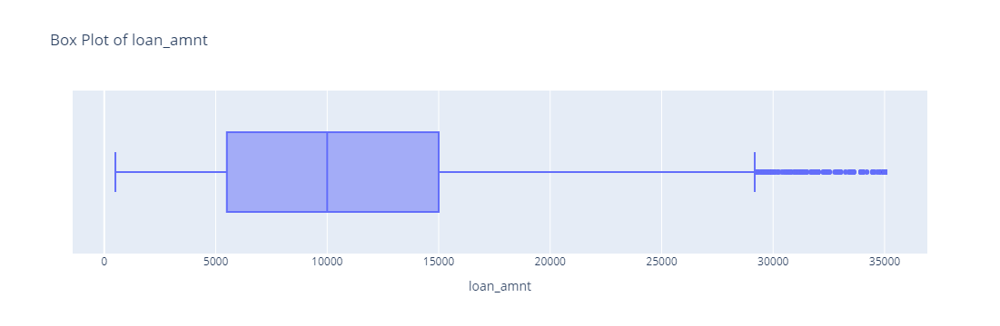

In [31]:
# Lets start with loan_amnt
# Box plot for a single numerical column loan_amnt
fig = px.box(loan_dataFrame, x='loan_amnt', title='Box Plot of loan_amnt')
fig.update_xaxes(tickprefix='', tickformat='d')
fig.show()

In [32]:
# Here maximum value (35000) is not much higher than the upper fence (29700), so it will not have much impact

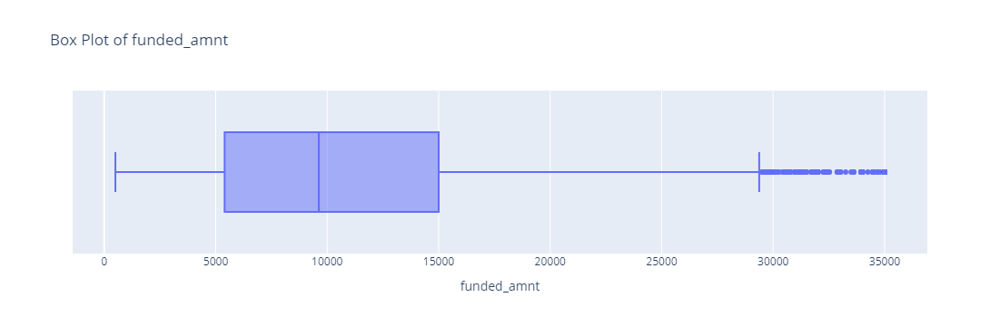

In [33]:
# Now we will see funded_amnt
# Box plot for a single numerical column funded_amnt
fig = px.box(loan_dataFrame, x='funded_amnt', title='Box Plot of funded_amnt')
fig.update_xaxes(tickprefix='', tickformat='d')
fig.show()

In [34]:
# Here maximum value (35000) is not much higher than the upper fence (298500), so it will not have much impact

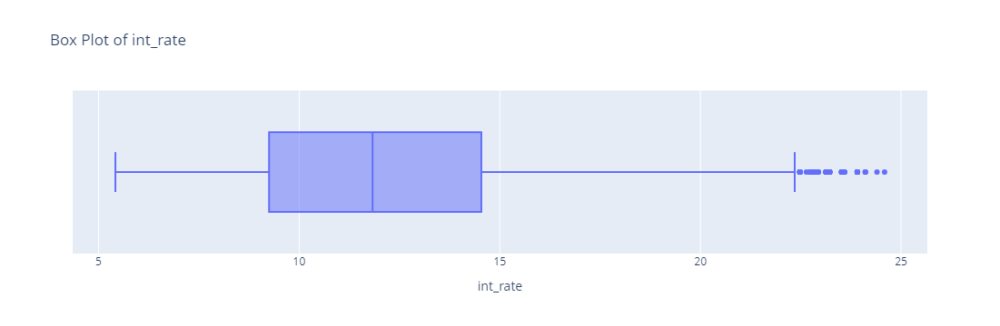

In [35]:
# Now we will see int_rate
# Box plot for a single numerical column int_rate
fig = px.box(loan_dataFrame, x='int_rate', title='Box Plot of int_rate')
fig.show()

In [36]:
# Here maximum value (24.4) is not much higher than the upper fence (22.35), so it will not have much impact

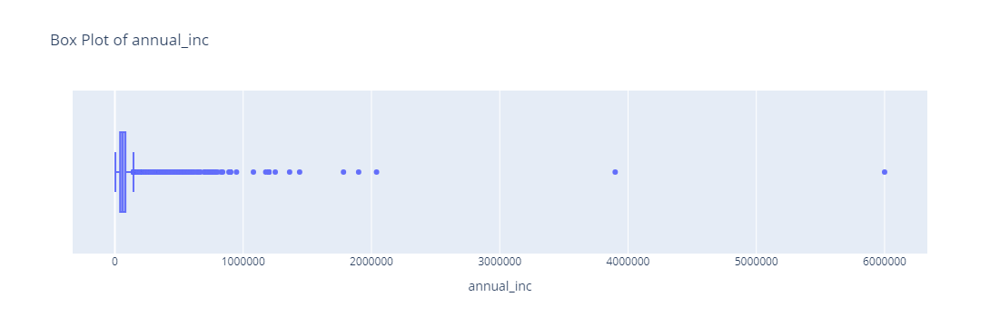

In [37]:
# Now we will see annual_inc
# Box plot for a single numerical column annual_inc
fig = px.box(loan_dataFrame, x='annual_inc', title='Box Plot of annual_inc')
fig.update_xaxes(tickprefix='', tickformat='d')
fig.show()

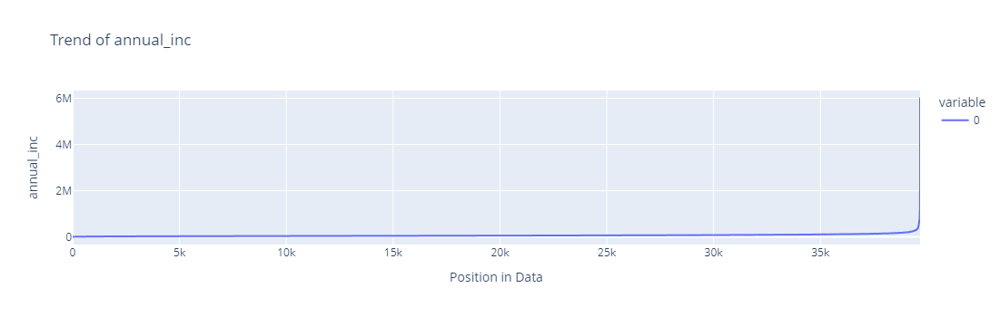

In [38]:
# Here maximum value (6000k) is significantly higher than the upper fence (146k), these values are considered outliers and should be removed to improve the quality of the data analysis.

# To determine the appropriate quantile for removing outliers in the annual_inc column, 
# we can analyze the trend of the values using a line chart. By visualizing the sorted values,
# we can identify where the data starts to deviate significantly, which will help you decide on the appropriate threshold for outlier removal.

fig = px.line(sorted(loan_dataFrame.annual_inc), width=750, height=350,
              title='Trend of annual_inc',
              labels={'value': 'annual_inc', 'index': 'Position in Data'})
fig.show()

In [39]:
# As observed from the line chart, the annual income values increase exponentially around the 99th percentile. 
# Therefore, we can remove values greater than the 99th percentile.
loan_dataFrame = loan_dataFrame[loan_dataFrame.annual_inc <= np.percentile(loan_dataFrame.annual_inc, 99)]

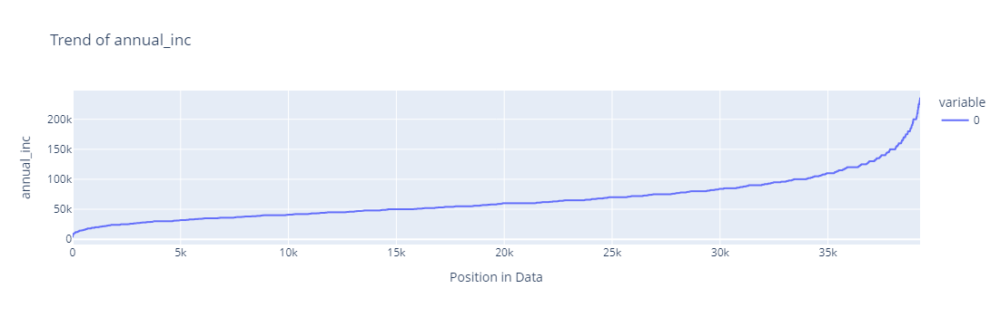

In [40]:
# Lets observe line chart after removing the outliers
fig = px.line(sorted(loan_dataFrame.annual_inc), width=750, height=350,
              title='Trend of annual_inc',
              labels={'value': 'annual_inc', 'index': 'Position in Data'})
fig.show()

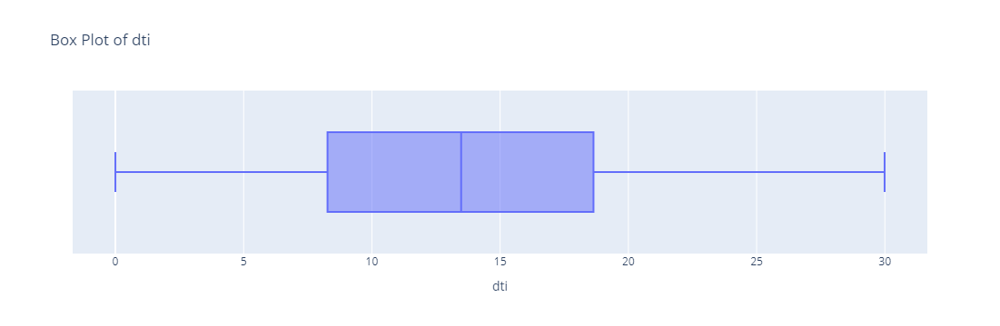

In [41]:
# Now we will see dti
# Box plot for a single numerical column dti
fig = px.box(loan_dataFrame, x='dti', title='Box Plot of dti')
fig.show()

In [42]:
# As we can see no outliers are present in dti column so we can proceed

### Filtering Data

In [43]:
# The goal of this analysis is to see who is likely to default and this can only be said in case of either fully paid or charged off loans.
# So, removing loans with status as 'Current'

# Shape of the dataframe before removing columns
print(loan_dataFrame.shape)

loan_dataFrame = loan_dataFrame[loan_dataFrame.loan_status!='Current']
# Shape of the dataframe after removing columns
print(loan_dataFrame.shape)

(39270, 21)
(38144, 21)


### Derived columns

In [44]:
# Lets derive some new columns using existing data as it may further used in analysis.
# create month and year columns separately
loan_dataFrame.issue_d = pd.to_datetime(loan_dataFrame.issue_d, format='%b-%y')
loan_dataFrame['issue_year']=loan_dataFrame['issue_d'].dt.year
loan_dataFrame['issue_month']=loan_dataFrame['issue_d'].dt.month

# Convert to integer
loan_dataFrame['issue_year'] = loan_dataFrame['issue_year'].astype(int)
loan_dataFrame['issue_month'] = loan_dataFrame['issue_month'].astype(int)

print(loan_dataFrame.head)

<bound method NDFrame.head of        loan_amnt  funded_amnt  term  int_rate  installment grade sub_grade  \
0           5000         5000    36     10.65       162.87     B        B2   
1           2500         2500    60     15.27        59.83     C        C4   
2           2400         2400    36     15.96        84.33     C        C5   
3          10000        10000    36     13.49       339.31     C        C1   
5           5000         5000    36      7.90       156.46     A        A4   
...          ...          ...   ...       ...          ...   ...       ...   
39712       2500         2500    36      8.07        78.42     A        A4   
39713       8500         8500    36     10.28       275.38     C        C1   
39714       5000         5000    36      8.07       156.84     A        A4   
39715       5000         5000    36      7.43       155.38     A        A2   
39716       7500         7500    36     13.75       255.43     E        E2   

       emp_length home_ownership 

In [45]:
#creating bins for int_rate, annual_inc, open_acc,revol_util and total_acc for better analysis
loan_dataFrame['int_rate_groups'] = pd.cut(loan_dataFrame['int_rate'], bins=5,precision =0,labels=['5%-9%','9%-13%','13%-17%','17%-21%','21%-24%'])
loan_dataFrame['annual_inc_groups'] = pd.cut(loan_dataFrame['annual_inc'], bins=5,precision =0,labels =['3k-31k','31k-58k','58k-85k','85k-112k','112k-140k'])
loan_dataFrame['open_acc_groups'] = pd.cut(loan_dataFrame['open_acc'],bins = 5,precision =0,labels=['2-10','10-19','19-27','27-36','36-44'])
loan_dataFrame['revol_util_groups'] = pd.cut(loan_dataFrame['revol_util'], bins=5,precision =0,labels=['0-20','20-40','40-60','60-80','80-100'])
loan_dataFrame['total_acc_groups'] = pd.cut(loan_dataFrame['total_acc'], bins=5,precision =0,labels=['2-20','20-37','37-55','55-74','74-90'])

## 4. Data Visualization and Analysis

### Univariate Analysis

Descriptive Statistics:
count    38144.000000
mean     10970.401636
std       7266.149978
min        500.000000
25%       5200.000000
50%       9600.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64


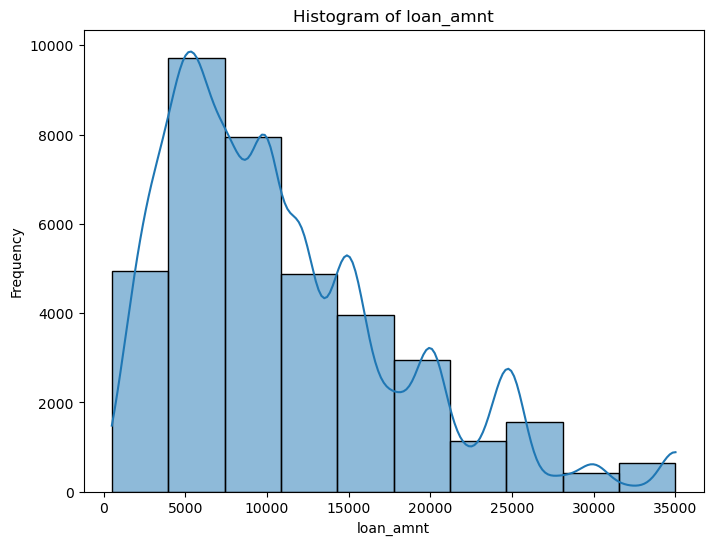

In [46]:
# Starting with loan_amnt - Loan amount(The listed amount of the loan applied for by the borrower.)

# 1. Descriptive Statistics
print("Descriptive Statistics:")
print(loan_dataFrame["loan_amnt"].describe())

# 2. Histogram using Matplotlib
plt.figure(figsize=(8, 6))
sns.histplot(loan_dataFrame["loan_amnt"], bins=10, kde=True)
plt.title('Histogram of loan_amnt')
plt.xlabel('loan_amnt')
plt.ylabel('Frequency')
plt.show()

#### Inference: The loan amount varies from 500 to 35000 with a mean of 9600.

Descriptive Statistics:
count    38144.000000
mean     10710.967649
std       7010.893186
min        500.000000
25%       5100.000000
50%       9500.000000
75%      15000.000000
max      35000.000000
Name: funded_amnt, dtype: float64


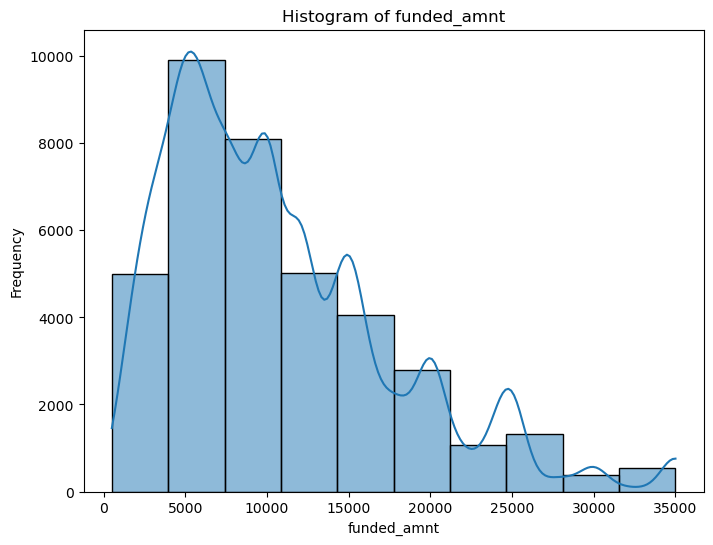

In [47]:
# funded_amnt - funded amount (The total amount committed to that loan at that point in time.)

# 1. Descriptive Statistics
print("Descriptive Statistics:")
print(loan_dataFrame["funded_amnt"].describe())

# 2. Histogram using Matplotlib
plt.figure(figsize=(8, 6))
sns.histplot(loan_dataFrame["funded_amnt"], bins=10, kde=True)
plt.title('Histogram of funded_amnt')
plt.xlabel('funded_amnt')
plt.ylabel('Frequency')
plt.show()


#### Inference: The funded_amnt varies from 500 to 35000 with a mean of 9500.

term
36    75.435193
60    24.564807
Name: count, dtype: float64


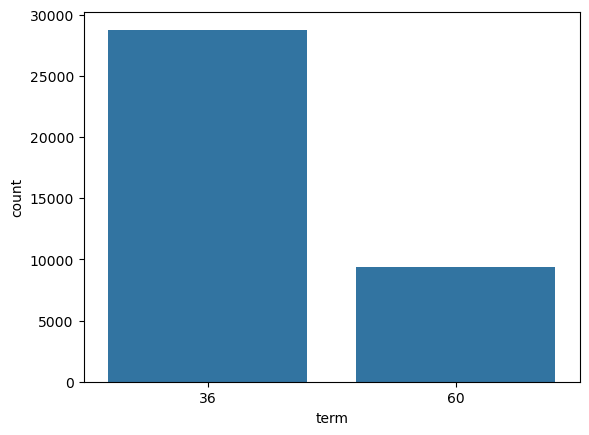

In [48]:
# term - Loan term (The number of payments on the loan. Values are in months and can be either 36 or 60..)

# 1. Descriptive Statistics
print(loan_dataFrame.term.value_counts()*100/loan_dataFrame.term.count())

# Create the countplot
sns.countplot(x='term', data=loan_dataFrame)
plt.show()

#### Inference: More than 75% of the loans have been taken for 36 months compared to 60 months of term.

Descriptive Statistics:
count    38144.000000
mean        11.913032
std          3.682888
min          5.420000
25%          8.940000
50%         11.710000
75%         14.350000
max         24.400000
Name: int_rate, dtype: float64


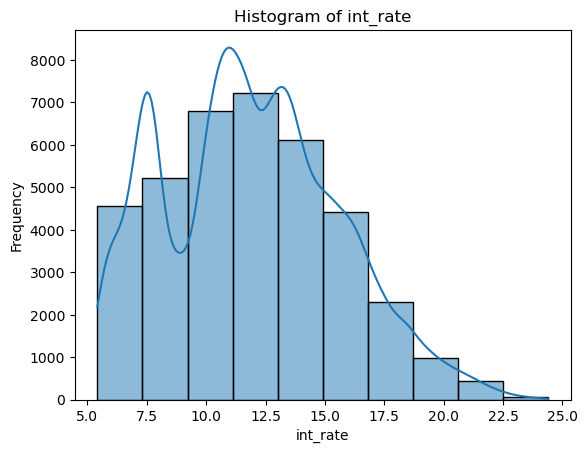

In [49]:
# int_rate - Interest rate (Interest Rate on the loan.)

# 1. Descriptive Statistics
print("Descriptive Statistics:")
print(loan_dataFrame["int_rate"].describe())

# 2. Histogram using Matplotlib

sns.histplot(loan_dataFrame["int_rate"], bins=10, kde=True)
plt.title('Histogram of int_rate')
plt.xlabel('int_rate')
plt.ylabel('Frequency')
plt.show()

#### Inference: The highest interest rate is more than 24% and minimum is just more than 5%. Most Borrowers have taken loan at 12.5% and least at just less than 25%.

int_rate_groups
9%-13%     36.781669
13%-17%    27.645239
5%-9%      25.629195
17%-21%     8.609480
21%-24%     1.334417
Name: count, dtype: float64


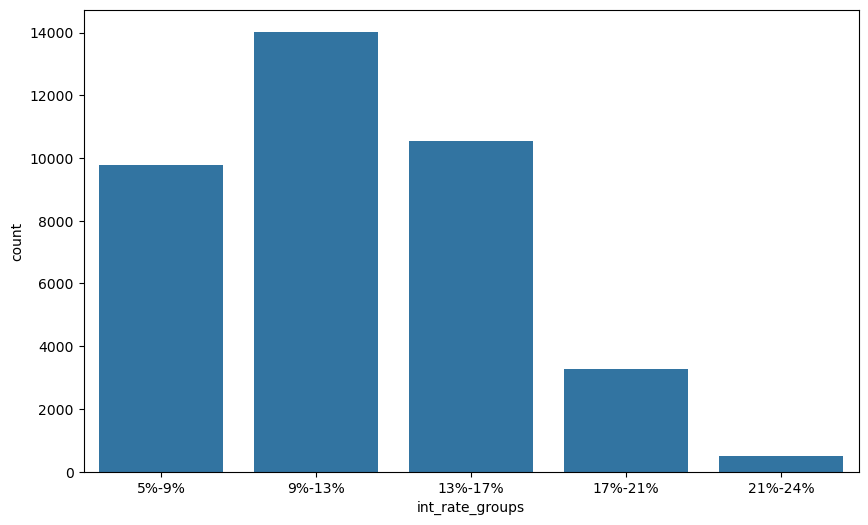

In [50]:
# int_rate - Interest rate (Interest Rate on the loan.)
# Created BINS to help in better analyzing the data and put it in int_rate_groups column

# 1. Descriptive Statistics
print(loan_dataFrame.int_rate_groups.value_counts()*100/loan_dataFrame.int_rate_groups.count())

# Create the countplot
plt.figure(figsize=(10,6))
sns.countplot(x='int_rate_groups', data=loan_dataFrame)
plt.xlabel('int_rate_groups')
plt.ylabel('count')
plt.show()

#### Inference: Most people have taken loan at interest rate of 9%-13%.

Descriptive Statistics:
count    38144.000000
mean       320.141016
std        205.953541
min         15.690000
25%        165.380000
50%        276.625000
75%        421.890000
max       1305.190000
Name: installment, dtype: float64


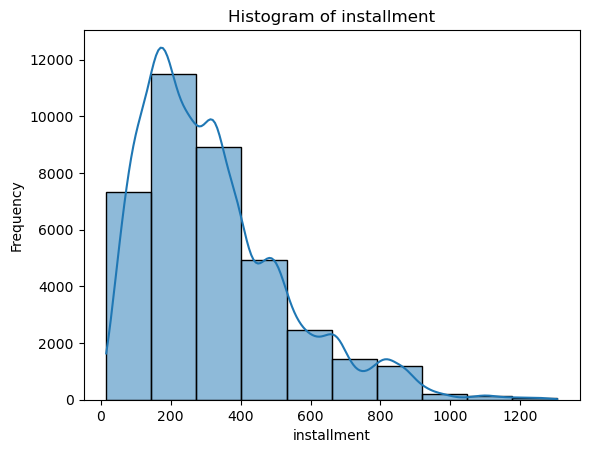

In [51]:
# installment - installment (The monthly payment owed by the borrower if the loan originates.)

# 1. Descriptive Statistics
print("Descriptive Statistics:")
print(loan_dataFrame["installment"].describe())

# 2. Histogram using Matplotlib

sns.histplot(loan_dataFrame["installment"], bins=10, kde=True)
plt.title('Histogram of installment')
plt.xlabel('installment')
plt.ylabel('Frequency')
plt.show()

#### Inference: The highest montly installment is more than 1305 and minimum is just more than 15.

Descriptive Statistics:
count     38144
unique        7
top           B
freq      11580
Name: grade, dtype: object
grade
B    30.358641
A    26.158767
C    20.288905
D    13.142303
E     6.813654
F     2.485319
G     0.752412
Name: count, dtype: float64


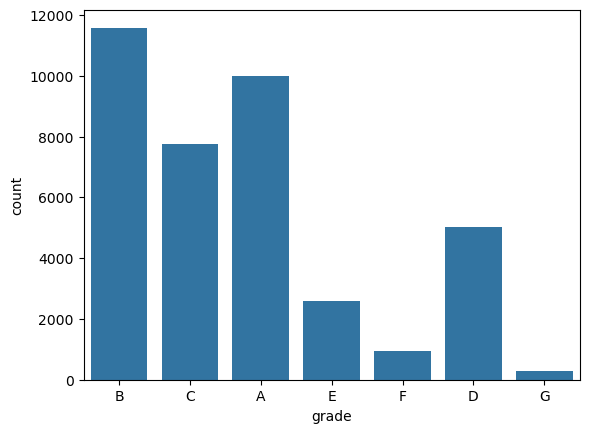

In [52]:
# grade - grade (LC assigned loan grade.)

# 1. Descriptive Statistics
print("Descriptive Statistics:")
print(loan_dataFrame["grade"].describe())

# 1. Descriptive Statistics
print(loan_dataFrame.grade.value_counts()*100/loan_dataFrame.grade.count())

# Create the countplot
sns.countplot(x='grade', data=loan_dataFrame)
plt.show()

#### Inference: The "B" grade loans are highest with more than 30% and "G" lowest.

Descriptive Statistics:
count     38144
unique       35
top          A4
freq       2854
Name: sub_grade, dtype: object
sub_grade
A4    7.482173
B3    7.319631
A5    7.062710
B5    6.816275
B4    6.354866
C1    5.321938
B2    5.185612
C2    5.004719
A3    4.716338
B1    4.682257
A2    3.929845
C3    3.845952
D2    3.319002
C4    3.140730
C5    2.975566
A1    2.967701
D3    2.883809
D1    2.406669
D4    2.372588
D5    2.160235
E1    1.866611
E2    1.575608
E3    1.316065
E4    1.098469
E5    0.956900
F1    0.781250
F2    0.600357
F3    0.440436
F4    0.380138
F5    0.283138
G1    0.238570
G2    0.191380
G4    0.133704
G3    0.115352
G5    0.073406
Name: count, dtype: float64


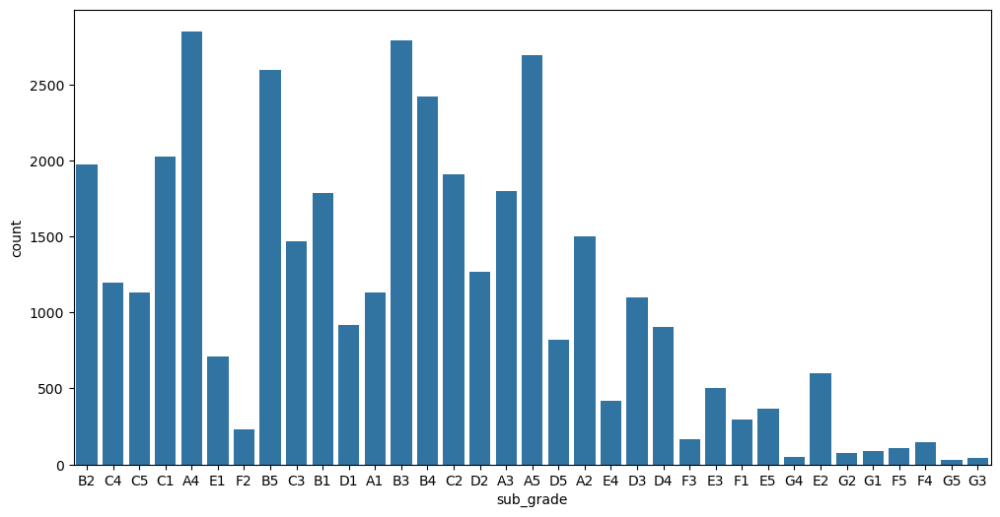

In [53]:
# sub_grade - sub grade (LC assigned loan subgrade.)

# 1. Descriptive Statistics
print("Descriptive Statistics:")
print(loan_dataFrame["sub_grade"].describe())

# 1. Descriptive Statistics
print(loan_dataFrame.sub_grade.value_counts()*100/loan_dataFrame.sub_grade.count())

# Create the countplot
plt.figure(figsize=(12,6))
sns.countplot(x='sub_grade', data=loan_dataFrame)
plt.show()

#### Inference: Most loans are in "A" and "B" Sub grade but highest in "A4".

Descriptive Statistics:
count    38144.000000
mean         5.187212
std          3.447244
min          1.000000
25%          2.000000
50%          4.000000
75%          9.000000
max         10.000000
Name: emp_length, dtype: float64
emp_length
10    24.585780
1     19.937605
2     11.115772
3     10.415793
4      8.677643
5      8.294883
6      5.631292
7      4.441065
8      3.714870
9      3.185298
Name: count, dtype: float64


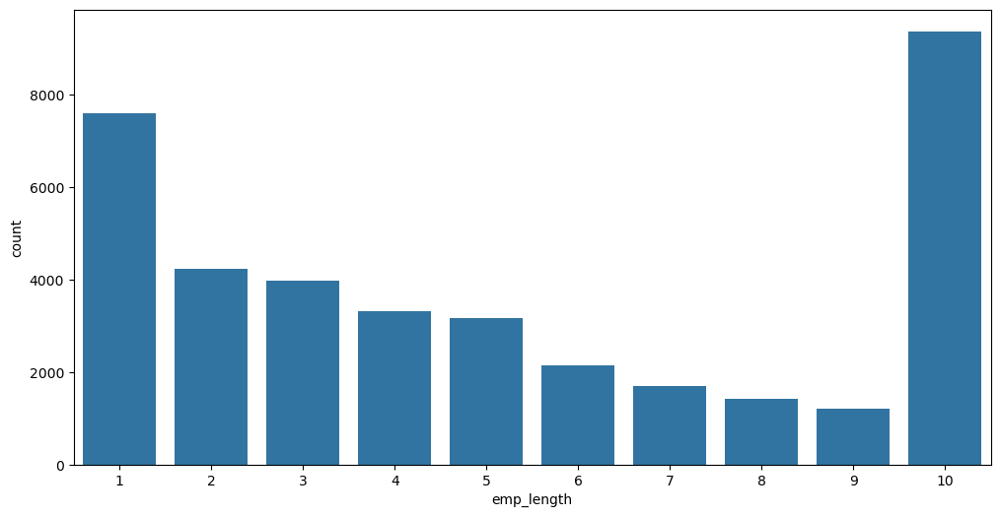

In [54]:
# emp_length - employement duration of borrowers (Employment length in years)

# 1. Descriptive Statistics
print("Descriptive Statistics:")
print(loan_dataFrame["emp_length"].describe())

# 1. Descriptive Statistics
print(loan_dataFrame.emp_length.value_counts()*100/loan_dataFrame.emp_length.count())

# Create the countplot
plt.figure(figsize=(12,6))
sns.countplot(x='emp_length', data=loan_dataFrame)
plt.show()

#### Inference: Most of the borrowers have work experience greater than 10 years.

Descriptive Statistics:
count     38144
unique        4
top        RENT
freq      18365
Name: home_ownership, dtype: object
home_ownership
RENT        48.146497
MORTGAGE    43.886326
OWN          7.712878
OTHER        0.254299
Name: count, dtype: float64


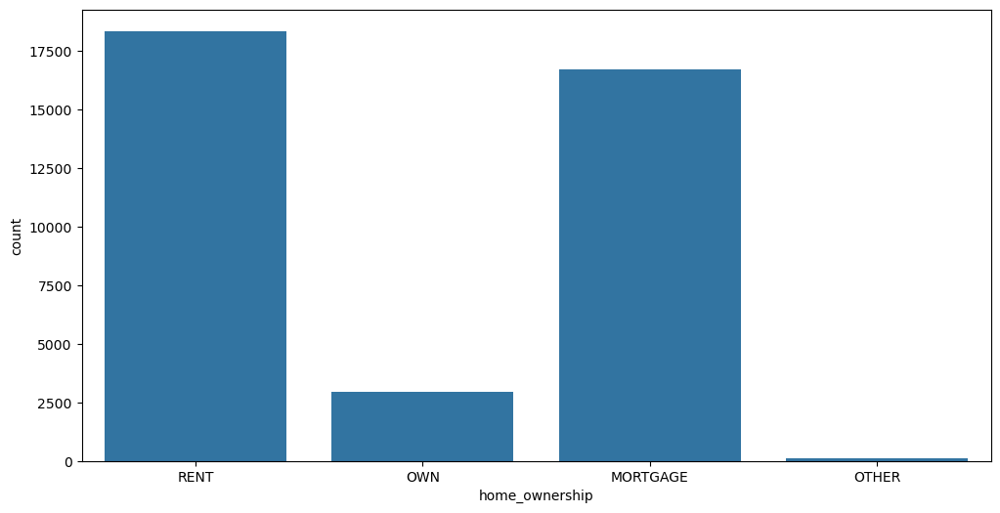

In [55]:
# home_ownership - home ownership of borrowers (The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.)

# 1. Descriptive Statistics
print("Descriptive Statistics:")
print(loan_dataFrame["home_ownership"].describe())

# 1. Descriptive Statistics
print(loan_dataFrame.home_ownership.value_counts()*100/loan_dataFrame.home_ownership.count())

# Create the countplot
plt.figure(figsize=(12,6))
sns.countplot(x='home_ownership', data=loan_dataFrame)
plt.show()

#### Inference: Most of the borrowers are not owing house but on either mortgage or rent.

Descriptive Statistics:
count     38144.000000
mean      65359.452048
std       35166.373589
min        4000.000000
25%       40000.000000
50%       58000.000000
75%       80400.000000
max      234996.000000
Name: annual_inc, dtype: float64


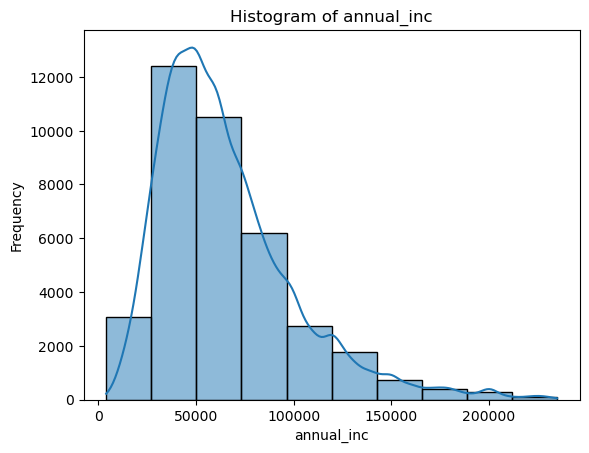

In [56]:
# annual_inc - annual income of borrowers (The self-reported annual income provided by the borrower during registration.)

# 1. Descriptive Statistics
print("Descriptive Statistics:")
print(loan_dataFrame["annual_inc"].describe())

# 2. Histogram using Matplotlib

sns.histplot(loan_dataFrame["annual_inc"], bins=10, kde=True)
plt.title('Histogram of annual_inc')
plt.xlabel('annual_inc')
plt.ylabel('Frequency')
plt.show()

#### Inference: Most of the borrowers are in low income range of around 60k. 

annual_inc_groups
31k-58k      43.763108
3k-31k       40.527999
58k-85k      11.776426
85k-112k      2.923133
112k-140k     1.009333
Name: count, dtype: float64


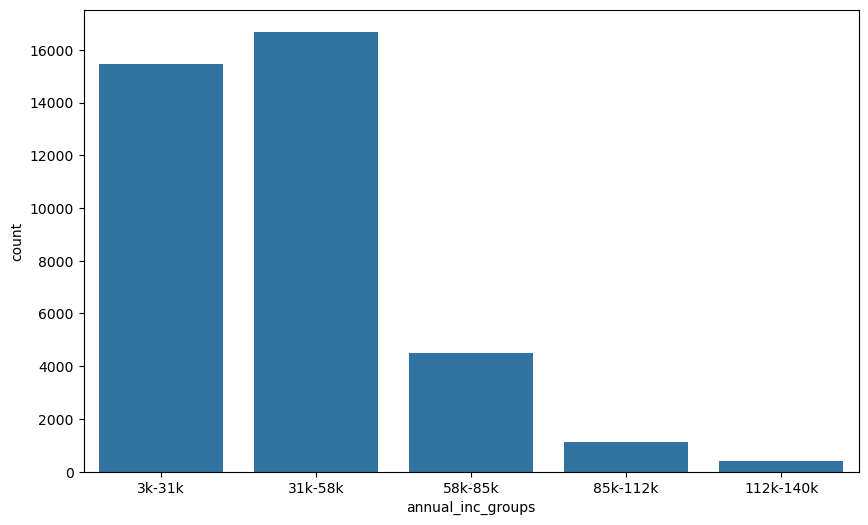

In [57]:
# annual_inc - annual income of borrowers (The self-reported annual income provided by the borrower during registration.)
# Created BINS to help in better analyzing the data and put it in annual_inc_groups column

# 1. Descriptive Statistics
print(loan_dataFrame.annual_inc_groups.value_counts()*100/loan_dataFrame.annual_inc_groups.count())

# Create the countplot
plt.figure(figsize=(10,6))
sns.countplot(x='annual_inc_groups', data=loan_dataFrame)
plt.xlabel('annual_inc_groups')
plt.ylabel('count')
plt.show()

#### Inference: Most of the borrowers are in the range of 3k-85k. 

Descriptive Statistics:
count            38144
unique               3
top       Not Verified
freq             16576
Name: verification_status, dtype: object
verification_status
Not Verified       43.456376
Verified           31.517408
Source Verified    25.026216
Name: count, dtype: float64


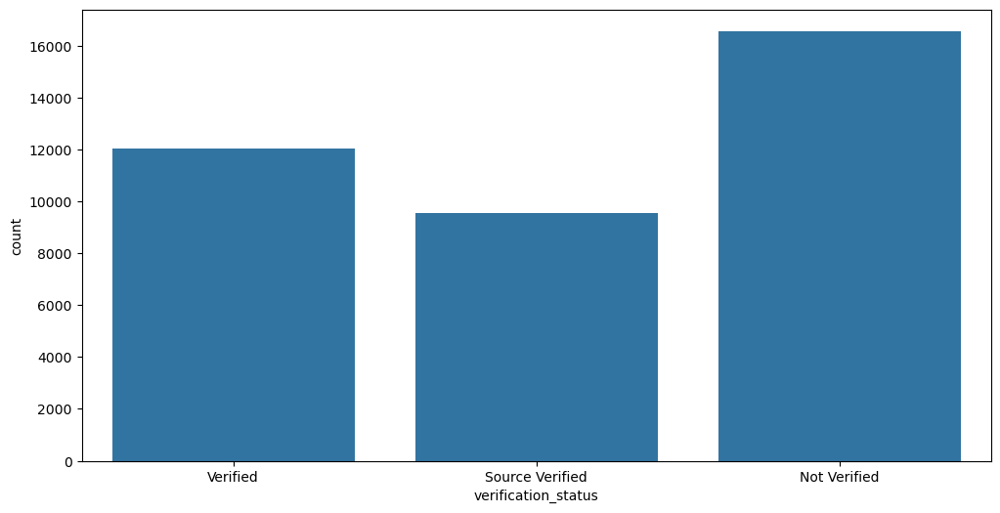

In [58]:
# verification_status - verification status (Indicates if income was verified by LC, not verified, or if the income source was verified)
# 1. Descriptive Statistics
print("Descriptive Statistics:")
print(loan_dataFrame["verification_status"].describe())

# 1. Descriptive Statistics
print(loan_dataFrame.verification_status.value_counts()*100/loan_dataFrame.verification_status.count())

# Create the countplot
plt.figure(figsize=(12,6))
sns.countplot(x='verification_status', data=loan_dataFrame)
plt.show()

#### Inference: More than 50% of the borrower's income or source is verified.But massive 43% are not verified.

issue_month
12    10.937500
11    10.394820
10     9.707949
9      9.076133
8      8.806103
7      8.690751
6      8.226720
5      7.571309
4      7.358956
3      6.949979
1      6.158242
2      6.121539
Name: count, dtype: float64


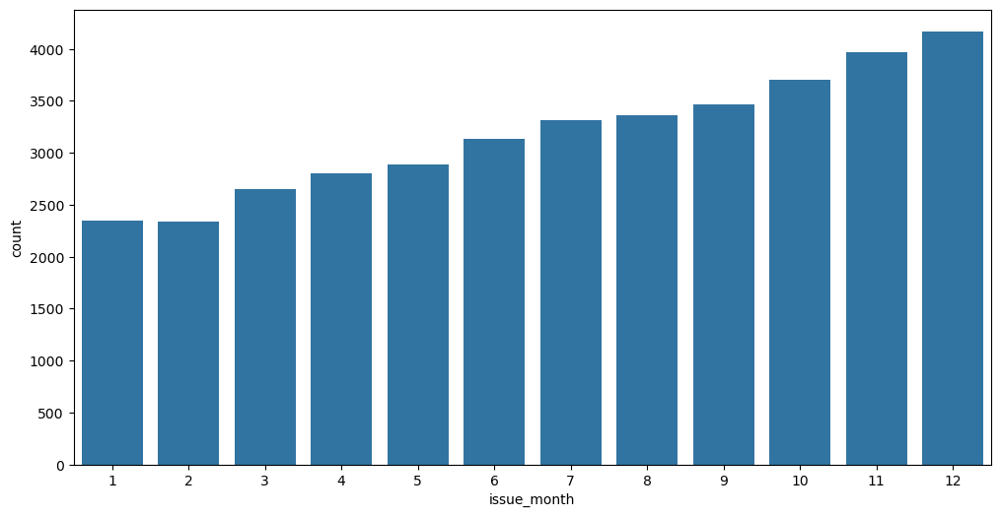

In [59]:
# issue_month - loan issue month (The month which the loan was funded) - Derived column from issue_d column

# 1. Descriptive Statistics
print(loan_dataFrame.issue_month.value_counts()*100/loan_dataFrame.issue_month.count())

# Create the countplot
plt.figure(figsize=(12,6))
sns.countplot(x='issue_month', data=loan_dataFrame)
plt.show()

#### Inference: The loan approval increased every month. And most loans were approved in 2nd half of the year.

issue_year
2011    53.242974
2010    29.871015
2009    12.190646
2008     4.047819
2007     0.647546
Name: count, dtype: float64


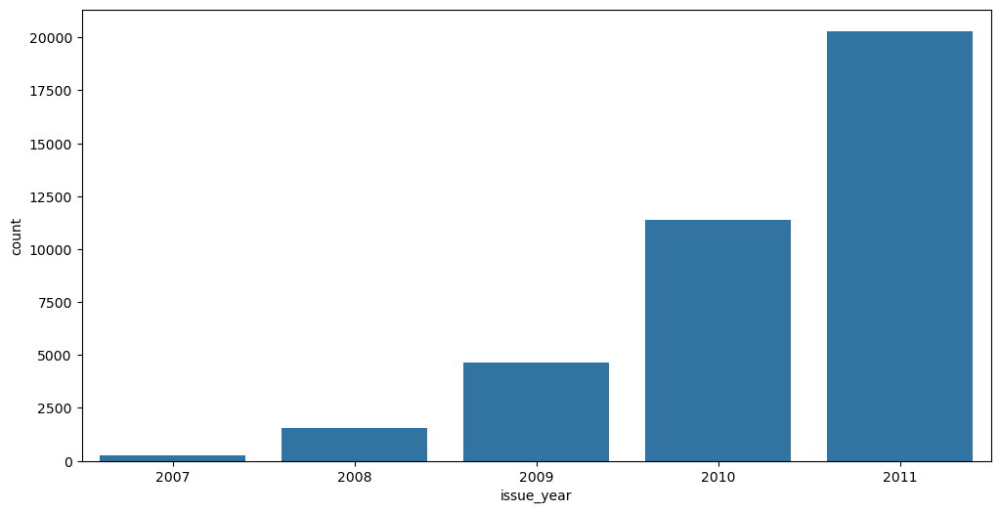

In [60]:
# issue_year - loan issue year (The year which the loan was funded) - Derived column from issue_d column

# 1. Descriptive Statistics
print(loan_dataFrame.issue_year.value_counts()*100/loan_dataFrame.issue_year.count())

# Create the countplot
plt.figure(figsize=(12,6))
sns.countplot(x='issue_year', data=loan_dataFrame)
plt.show()

#### Inference: More than 50% of the loans were sanctioned in 2011. The loan approval increased every year.

loan_status
Fully Paid     85.402685
Charged Off    14.597315
Name: count, dtype: float64


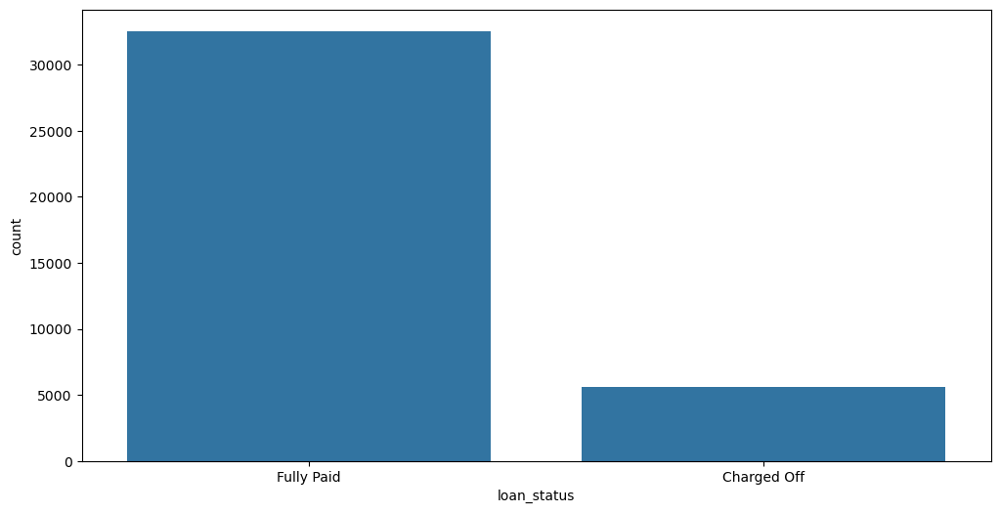

In [61]:
# loan_status - loan status (Current status of the loan)

# 1. Descriptive Statistics
print(loan_dataFrame.loan_status.value_counts()*100/loan_dataFrame.loan_status.count())

# Create the countplot
plt.figure(figsize=(12,6))
sns.countplot(x='loan_status', data=loan_dataFrame)
plt.show()

#### Inference: More than 85% loan were fully paid and around 15% Charged Off.

purpose
debt_consolidation    46.940541
credit_card           13.068897
other                 10.012060
home_improvement       7.319631
major_purchase         5.568372
small_business         4.514471
car                    3.906250
wedding                2.401426
medical                1.761745
moving                 1.489094
vacation               0.980495
house                  0.935927
educational            0.838926
renewable_energy       0.262164
Name: count, dtype: float64


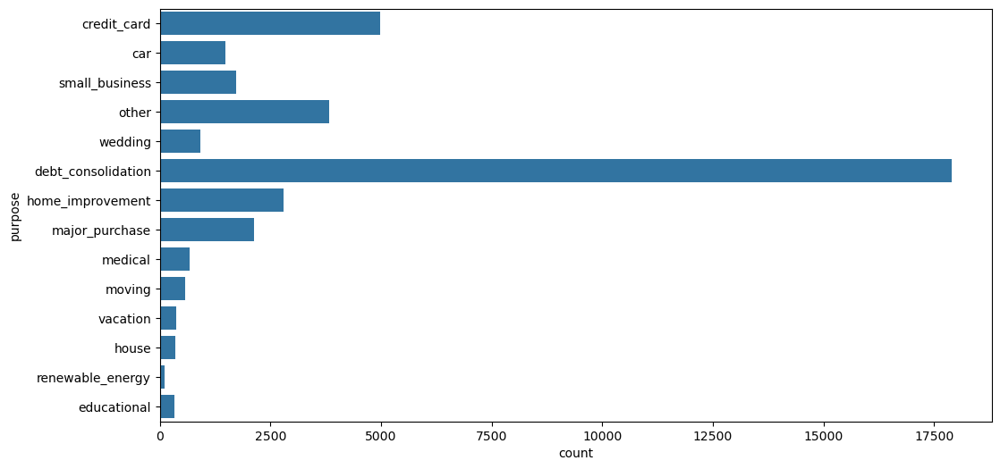

In [62]:
# purpose - loan purpose (purpose of the loan)

# 1. Descriptive Statistics
print(loan_dataFrame.purpose.value_counts()*100/loan_dataFrame.purpose.count())

# Create the countplot
plt.figure(figsize=(12,6))
sns.countplot(y='purpose', data=loan_dataFrame)
plt.xlabel('count')
plt.ylabel('purpose')
plt.show()

#### Inference: More than 46% of the loans were for debt_consolidation.

addr_state
CA    18.026426
NY     9.553272
FL     7.204279
TX     6.879195
NJ     4.619337
IL     3.819736
PA     3.814492
VA     3.557571
GA     3.539220
MA     3.350461
OH     3.064702
MD     2.642617
AZ     2.191695
WA     2.123532
CO     1.981963
NC     1.945260
CT     1.866611
MI     1.829908
MO     1.740772
MN     1.575608
NV     1.242659
SC     1.192848
WI     1.148280
OR     1.137794
AL     1.129929
LA     1.101091
KY     0.815331
OK     0.749790
KS     0.665898
UT     0.658033
AR     0.613465
DC     0.547924
RI     0.498112
NM     0.469274
WV     0.450923
HI     0.432571
NH     0.429950
DE     0.293624
MT     0.217596
WY     0.209732
AK     0.201867
SD     0.159920
VT     0.138947
MS     0.049811
TN     0.044568
IN     0.023595
ID     0.015730
IA     0.013108
NE     0.013108
ME     0.007865
Name: count, dtype: float64


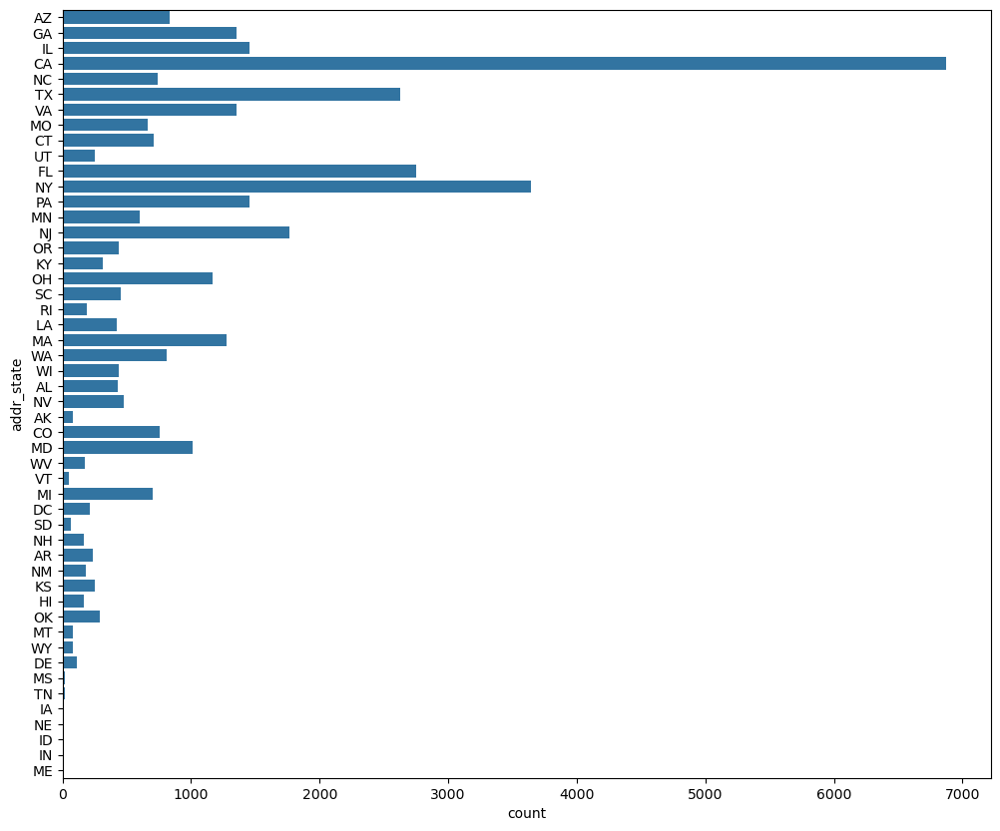

In [63]:
# addr_state - state of the borrower (The state provided by the borrower in the loan application)

# 1. Descriptive Statistics
print(loan_dataFrame.addr_state.value_counts()*100/loan_dataFrame.addr_state.count())

# Create the countplot
plt.figure(figsize=(12,10))
sns.countplot(y='addr_state', data=loan_dataFrame)
plt.xlabel('count')
plt.ylabel('addr_state')
plt.show()

#### Inference: More than 18% of the borrowers are from CA which is highest

Descriptive Statistics:
count    38144.000000
mean        13.336910
std          6.656202
min          0.000000
25%          8.220000
50%         13.440000
75%         18.600000
max         29.990000
Name: dti, dtype: float64


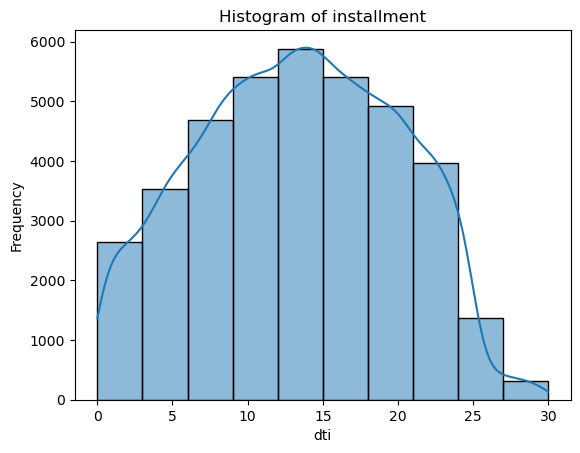

In [64]:
# dti - (A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.)

# 1. Descriptive Statistics
print("Descriptive Statistics:")
print(loan_dataFrame["dti"].describe())

# 2. Histogram using Matplotlib

sns.histplot(loan_dataFrame["dti"], bins=10, kde=True)
plt.title('Histogram of installment')
plt.xlabel('dti')
plt.ylabel('Frequency')
plt.show()

#### Inference: Most of the borrowers are in debt.

inq_last_6mths
0    48.584312
1    27.626888
2    14.631397
3     7.697148
4     0.807466
5     0.369652
6     0.162542
7     0.086514
8     0.034081
Name: count, dtype: float64


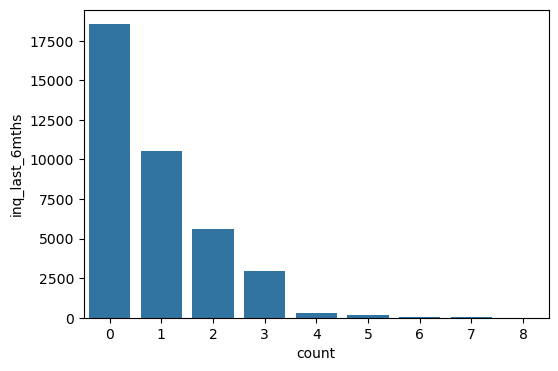

In [65]:
# inq_last_6mths - borrower credit inquiry(The number of inquiries in past 6 months (excluding auto and mortgage inquiries))

# 1. Descriptive Statistics
print(loan_dataFrame.inq_last_6mths.value_counts()*100/loan_dataFrame.inq_last_6mths.count())

# Create the countplot
plt.figure(figsize=(6,4))
sns.countplot(x='inq_last_6mths', data=loan_dataFrame)
plt.xlabel('count')
plt.ylabel('inq_last_6mths')
plt.show()

#### Inference: Around 42% of the borrowers had recent credit inquiries

open_acc_groups
2-10     66.883389
10-19    29.535445
19-27     3.371435
27-36     0.191380
36-44     0.018352
Name: count, dtype: float64


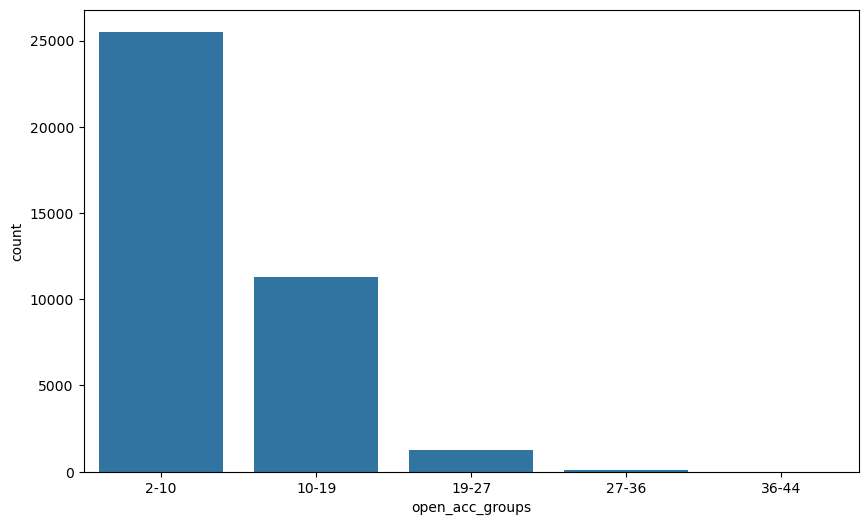

In [66]:
# open_acc - (The number of open credit lines in the borrower's credit file.)
# Created BINS to help in better analyzing the data and put it in open_acc_groups column

# 1. Descriptive Statistics
print(loan_dataFrame.open_acc_groups.value_counts()*100/loan_dataFrame.open_acc_groups.count())

# Create the countplot
plt.figure(figsize=(10,6))
sns.countplot(x='open_acc_groups', data=loan_dataFrame)
plt.ylabel('count')
plt.xlabel('open_acc_groups')
plt.show()

#### Inference: Many borrowers have open credit lines and 66% have between 2-10 credit line open.

revol_util_groups
40-60     21.838297
60-80     20.828964
20-40     20.055579
0-20      19.995281
80-100    17.281879
Name: count, dtype: float64


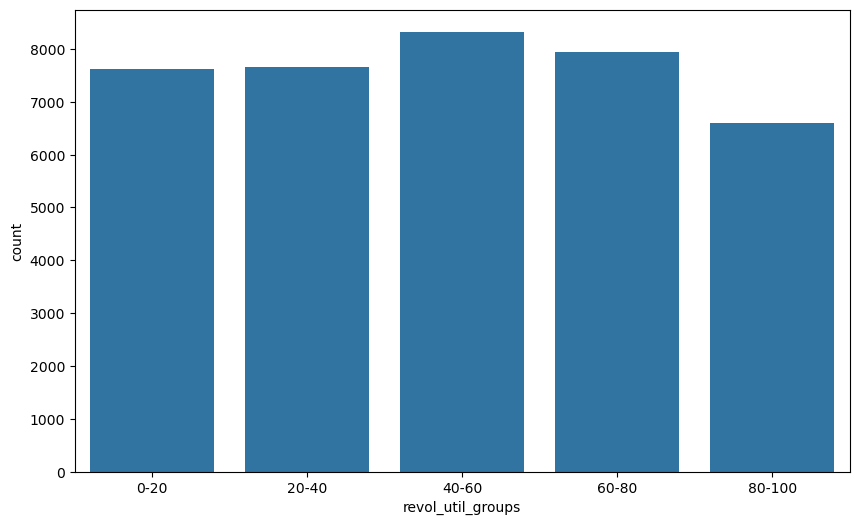

In [67]:
# revol_util - (Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.)
# Created BINS to help in better analyzing the data and put it in revol_util_groups column

# 1. Descriptive Statistics
print(loan_dataFrame.revol_util_groups.value_counts()*100/loan_dataFrame.revol_util_groups.count())

# Create the countplot
plt.figure(figsize=(10,6))
sns.countplot(x='revol_util_groups', data=loan_dataFrame)
plt.xlabel('revol_util_groups')
plt.ylabel('count')
plt.show()

#### Inference: Most of the borrowers are using some form of credits out of all revolving credit.

total_acc_groups
2-20     47.053272
20-37    42.994966
37-55     8.827076
55-74     1.087982
74-90     0.036703
Name: count, dtype: float64


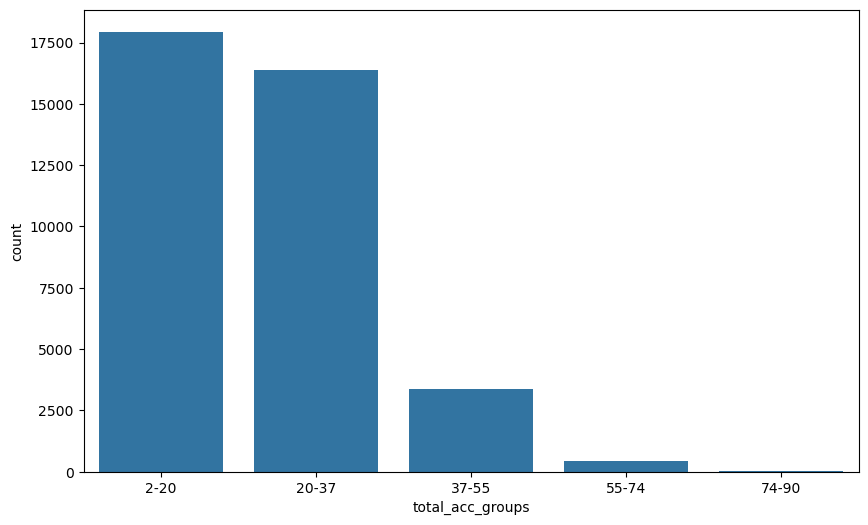

In [68]:
# total_acc - (The total number of credit lines currently in the borrower's credit file.)
# Created BINS to help in better analyzing the data and put it in total_acc_groups column

# 1. Descriptive Statistics
print(loan_dataFrame.total_acc_groups.value_counts()*100/loan_dataFrame.total_acc_groups.count())

# Create the countplot
plt.figure(figsize=(10,6))
sns.countplot(x='total_acc_groups', data=loan_dataFrame)
plt.xlabel('total_acc_groups')
plt.ylabel('count')
plt.show()

#### Inference: Most of the borrowers have credit lines ranging from 2-90

pub_rec_bankruptcies
0.0    95.708368
1.0     4.278523
2.0     0.013108
Name: count, dtype: float64


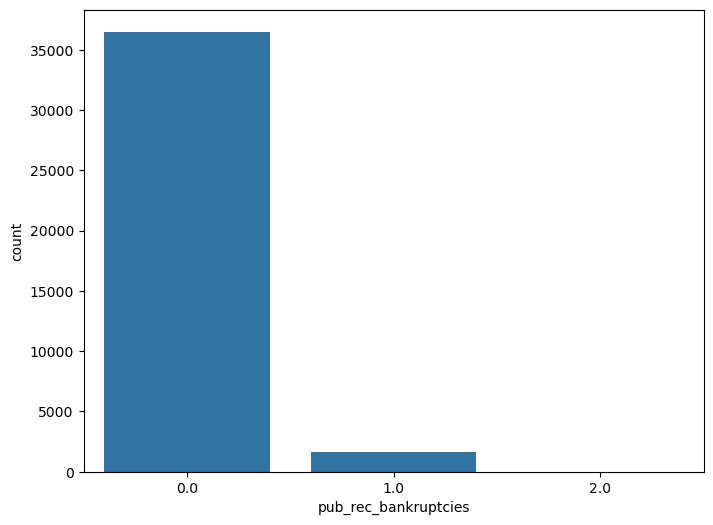

In [69]:
# pub_rec_bankruptcies - (Number of public record bankruptcies.)

# 1. Descriptive Statistics
print(loan_dataFrame.pub_rec_bankruptcies.value_counts()*100/loan_dataFrame.pub_rec_bankruptcies.count())

# Create the countplot
plt.figure(figsize=(8,6))
sns.countplot(x='pub_rec_bankruptcies', data=loan_dataFrame)
plt.xlabel('pub_rec_bankruptcies')
plt.ylabel('count')
plt.show()

#### Inference: Most borrowers have 0 public record bankruptcies

### Segmented Univariate Analysis

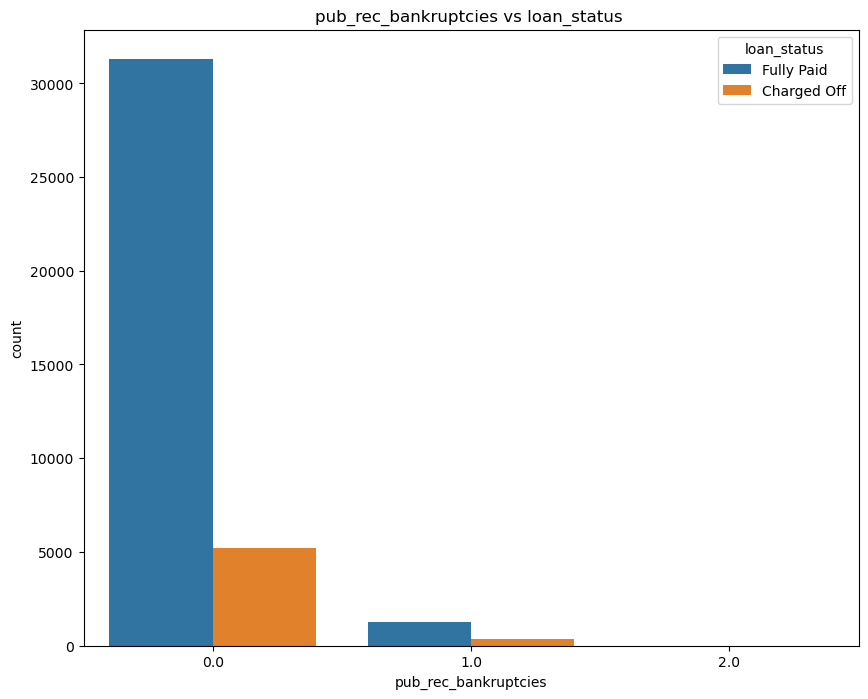

In [70]:
# pub_rec_bankruptcies based on loan_status
plt.figure(figsize=(10,8))
sns.countplot(data=loan_dataFrame,x='pub_rec_bankruptcies',hue='loan_status')
plt.xlabel('pub_rec_bankruptcies')
plt.ylabel('count')
plt.title('pub_rec_bankruptcies vs loan_status ',fontsize=12)
plt.show()

#### Inference: we can see that Borrowers having pub_rec_bankruptcies are more likely to default.

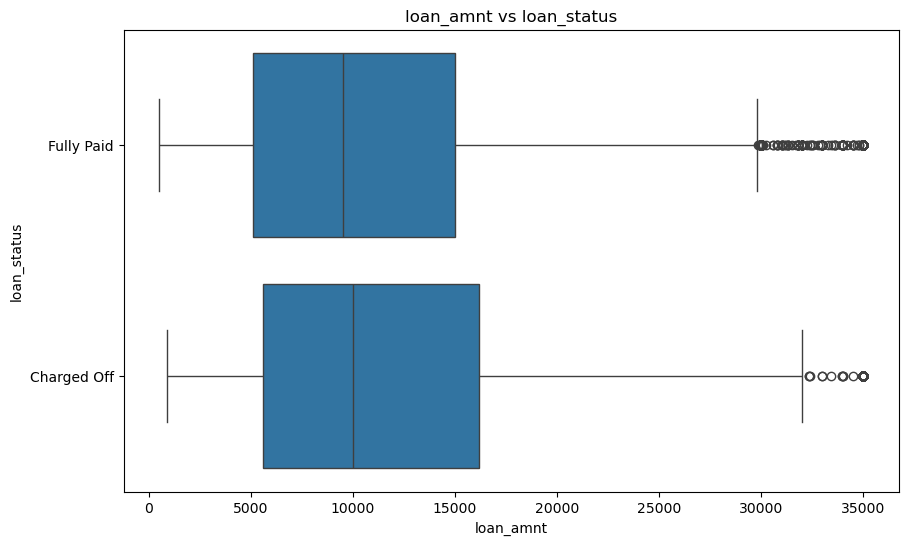

In [71]:
# loan_amnt based on loan_status
plt.figure(figsize=(10,6))
sns.boxplot(data=loan_dataFrame,x='loan_amnt',y='loan_status')
plt.xlabel('loan_amnt')
plt.ylabel('loan_status')
plt.title('loan_amnt vs loan_status',fontsize=12)
plt.show()

#### Inference: we can see that 75% percentile is edging towards right in the defaulted loan.So we can deduce that large amount of loan has higher chance of defaulting.

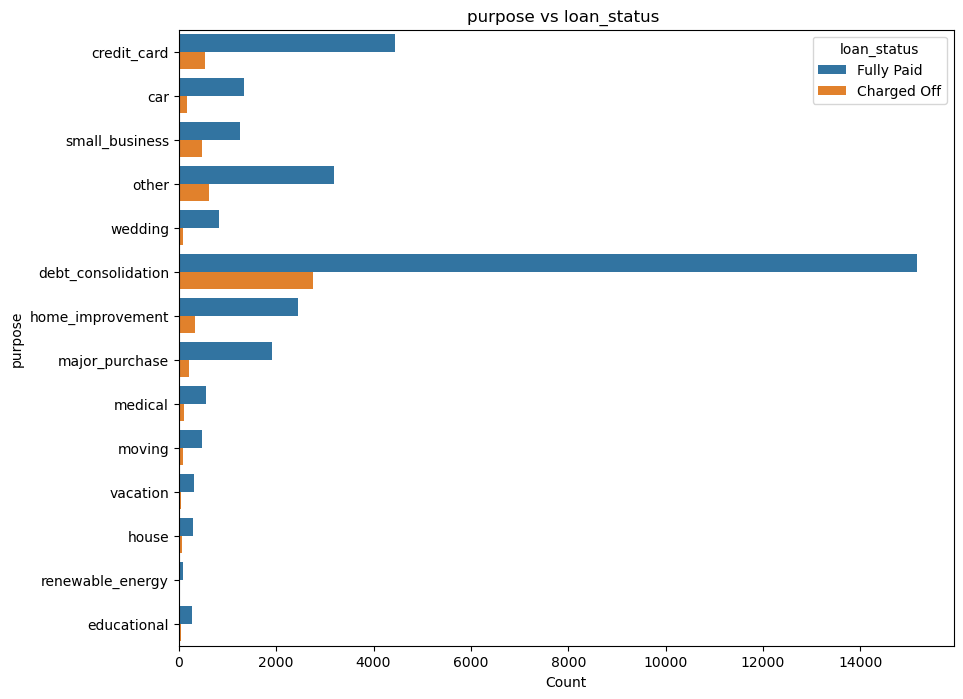

In [72]:
# purpose based on loan_status
plt.figure(figsize=(10,8))
sns.countplot(data=loan_dataFrame,y='purpose',hue='loan_status')
plt.xlabel('Count')
plt.ylabel('purpose')
plt.title('purpose vs loan_status ',fontsize=12)
plt.show()

#### Inference: we can say that Borrowers who take small_business loans have higher chance of defaulting.

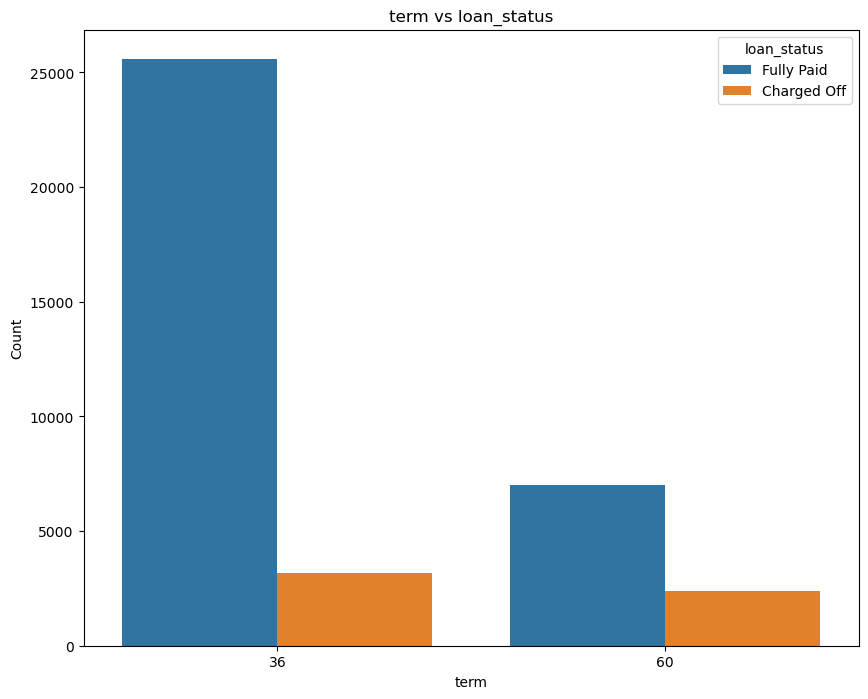

In [73]:
# term based on loan_status
plt.figure(figsize=(10,8))
sns.countplot(data=loan_dataFrame,x='term',hue='loan_status')
plt.xlabel('term')
plt.ylabel('Count')
plt.title('term vs loan_status',fontsize=12)
plt.show()

#### Inference: we can say that 60 month loan term has higher chance of defaulting.

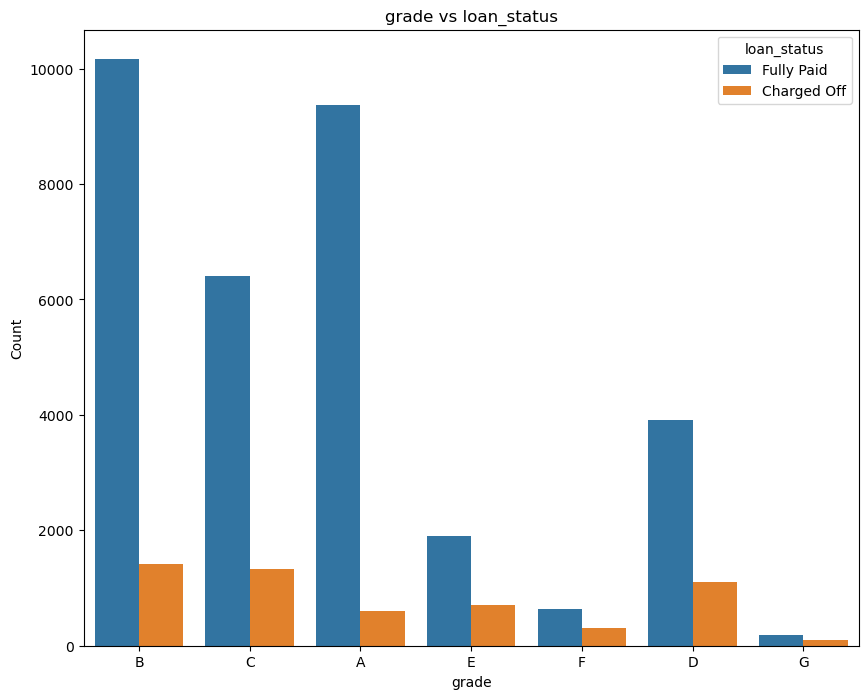

In [74]:
# grade vs loan_status
plt.figure(figsize=(10,8))
sns.countplot(data=loan_dataFrame,x='grade',hue='loan_status')
plt.xlabel('grade')
plt.ylabel('Count')
plt.title('grade vs loan_status',fontsize=12)
plt.show()

#### Inference: we can say that Grade F,D,G have higher chance of defaulting with G the highest.

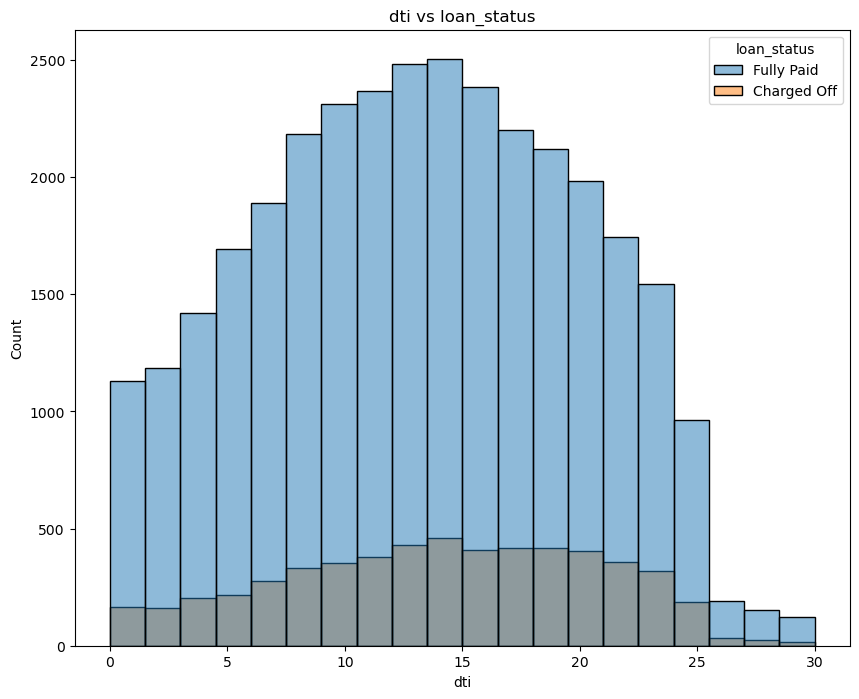

In [75]:
# dti vs loan_status
plt.figure(figsize=(10,8))
sns.histplot(data=loan_dataFrame,x='dti',hue='loan_status',bins=20)
plt.xlabel('dti')
plt.ylabel('Count')
plt.title('dti vs loan_status',fontsize=12)
plt.show()

#### Inference: we can say that loans in dti of 15 has higher chance of defaulting.

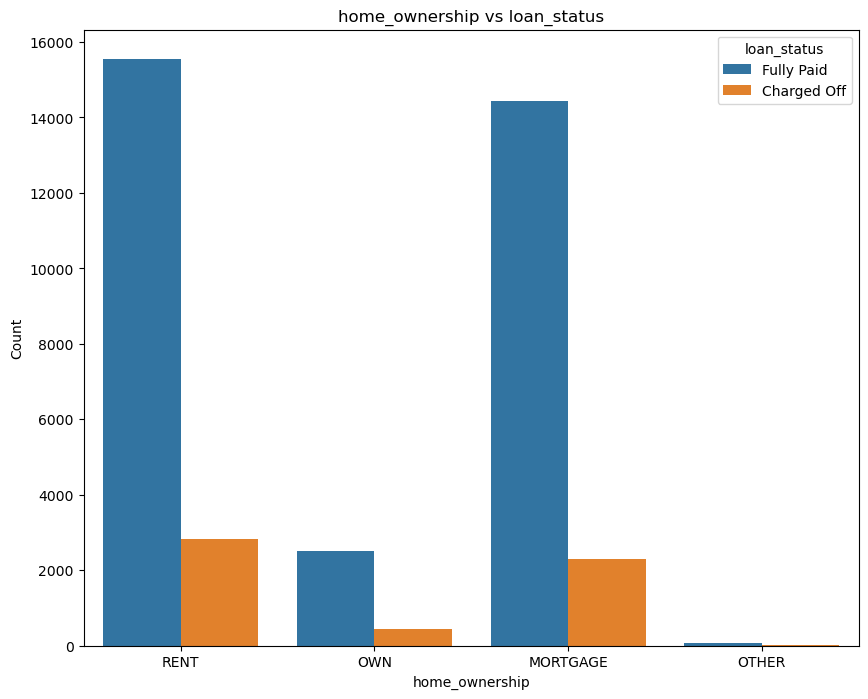

In [76]:
# house_ownership vs loan_status
plt.figure(figsize=(10,8))
sns.countplot(data=loan_dataFrame,x='home_ownership',hue='loan_status')
plt.xlabel('home_ownership')
plt.ylabel('Count')
plt.title('home_ownership vs loan_status',fontsize=12)
plt.show()

#### Inference: we can say that borrowers who are on RENT has higher chance of defaulting compared to Mortgage or own house.

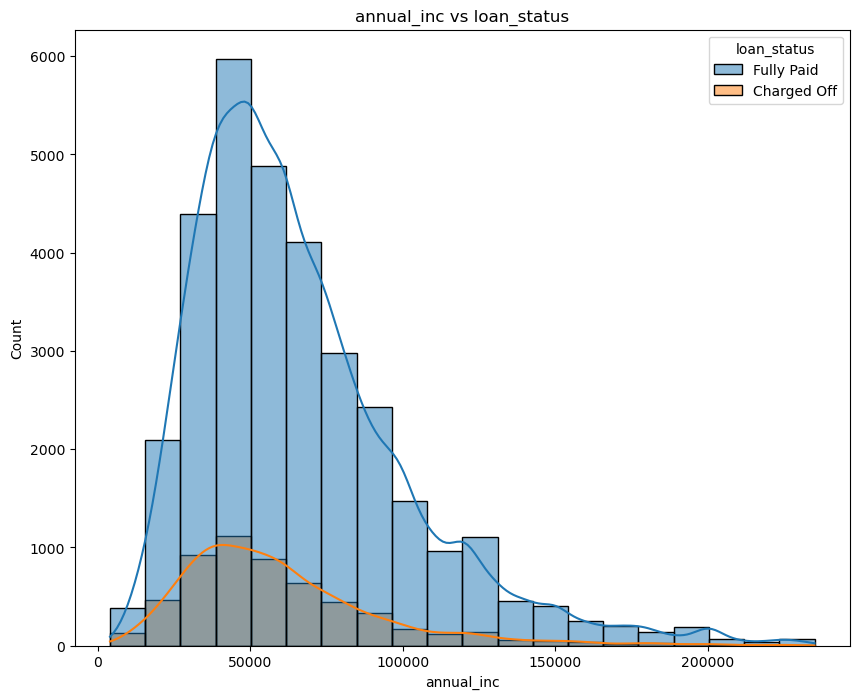

In [77]:
# annual_inc based on loan_status
plt.figure(figsize=(10,8))
sns.histplot(data=loan_dataFrame,x='annual_inc',hue='loan_status',bins=20,kde=True)
plt.xlabel('annual_inc')
plt.ylabel('Count')
plt.title('annual_inc vs loan_status')
plt.show()

#### Inference: we can say that higher income borrowers are less likely to default.

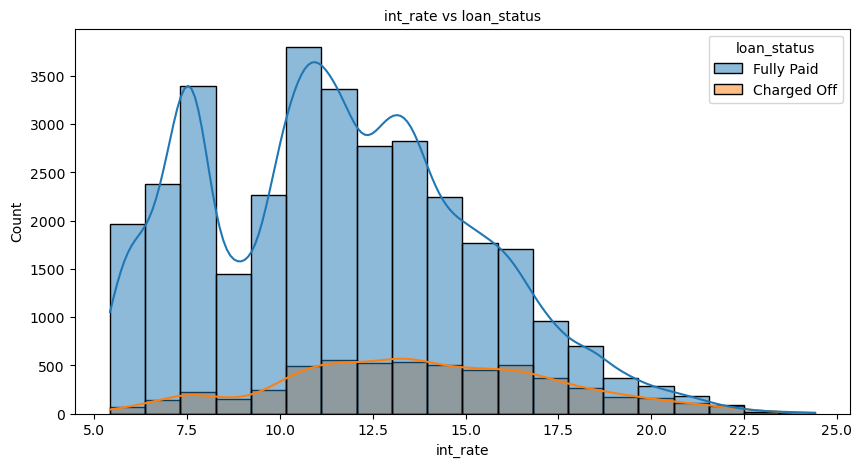

In [78]:
# int_rate based on loan_status
plt.figure(figsize=(10,5))
sns.histplot(data=loan_dataFrame,x='int_rate',hue='loan_status', bins=20, kde=True)
plt.xlabel('int_rate')
plt.ylabel('Count')
plt.title('int_rate vs loan_status',fontsize=10)
plt.show()

#### Inference: we can say that borrowers with High interest specifically above 17.5 are more likely to default.

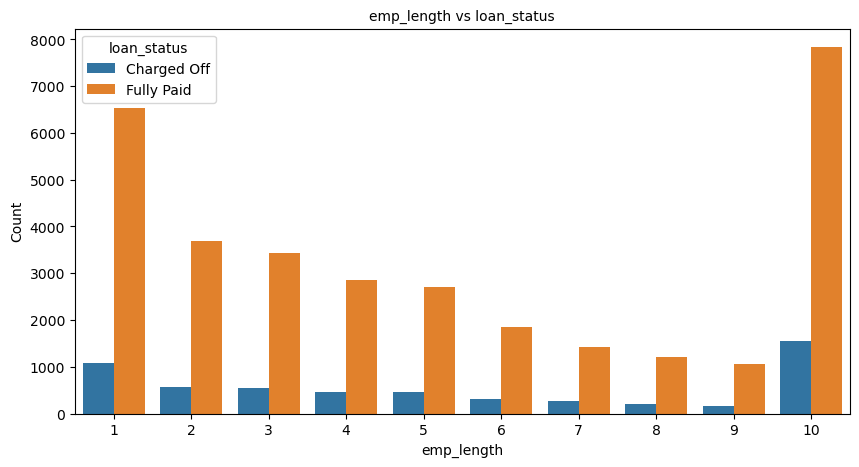

In [79]:
# emp_length vs loan_status
plt.figure(figsize=(10,5))
sns.countplot(data=loan_dataFrame,x='emp_length',hue='loan_status')
plt.xlabel('emp_length')
plt.ylabel('Count')
plt.title('emp_length vs loan_status',fontsize=10)
plt.show()

#### Inference: we can say that borrowers with experience of 10+ years are more likely to default.

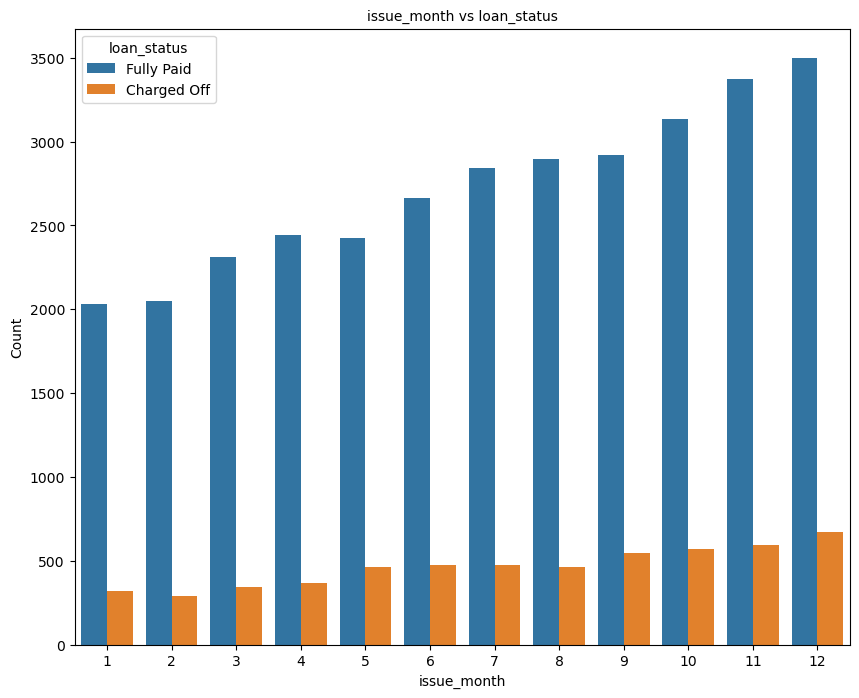

In [80]:
# issue_month vs loan_status
plt.figure(figsize=(10,8))
sns.countplot(data=loan_dataFrame,x='issue_month',hue='loan_status')
plt.xlabel('issue_month')
plt.ylabel('Count')
plt.title('issue_month vs loan_status',fontsize=10)
plt.show()

#### Inference: we can say that most defaults and Fully paid was in december month.|

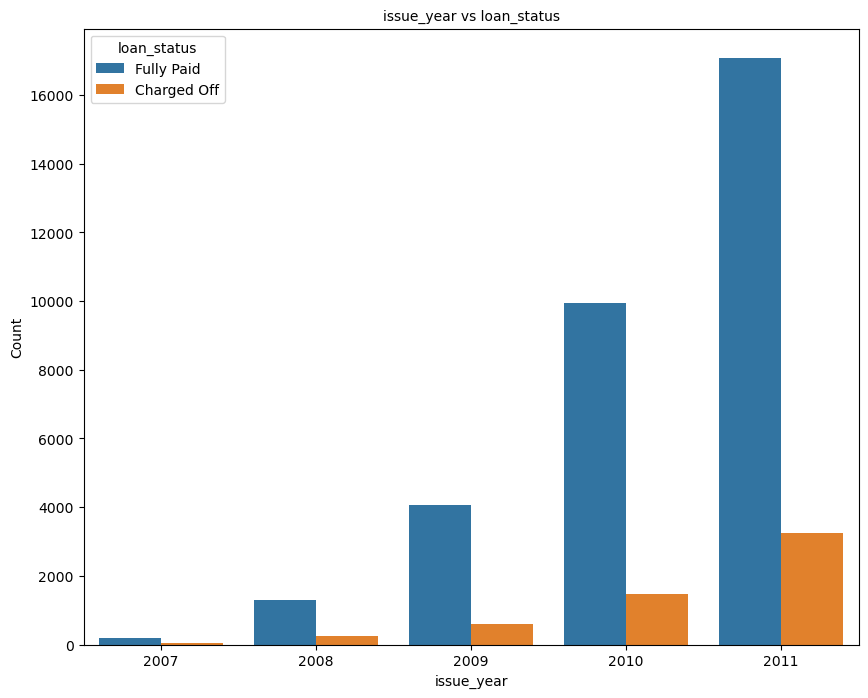

In [81]:
# issue_year vs loan_status
plt.figure(figsize=(10,8))
sns.countplot(data=loan_dataFrame,x='issue_year',hue='loan_status')
plt.xlabel('issue_year')
plt.ylabel('Count')
plt.title('issue_year vs loan_status',fontsize=10)
plt.show()

#### Inference: we can say that most defaults and fullypaid was in year 2011.

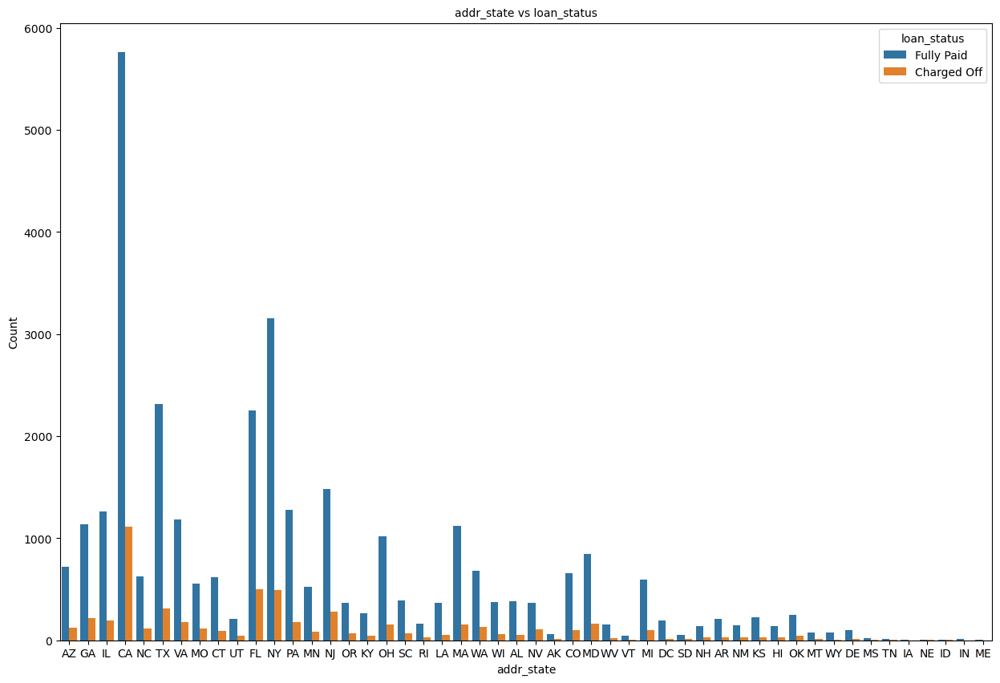

In [82]:
# addr_state vs loan_status
plt.figure(figsize=(15,10))
sns.countplot(data=loan_dataFrame,x='addr_state',hue='loan_status')
plt.xlabel('addr_state')
plt.ylabel('Count')
plt.title('addr_state vs loan_status',fontsize=10)
plt.show()

#### Inference: we can say that major borrowers are from CA, FL and NY.

### Bivariate Analysis

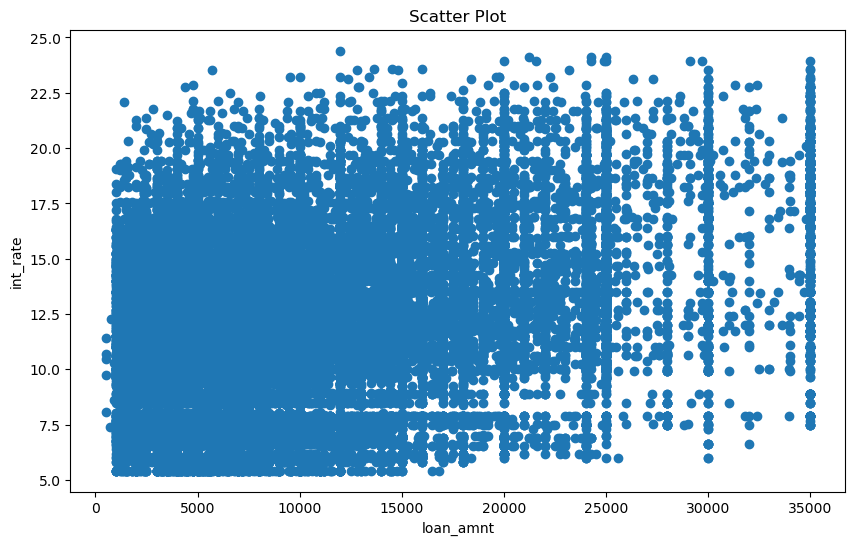

In [83]:
# Scatter plot using Matplotlib- loan_amnt vs int_rate
plt.figure(figsize=(10,6))
plt.scatter(loan_dataFrame['loan_amnt'], loan_dataFrame['int_rate'])
plt.xlabel('loan_amnt')
plt.ylabel('int_rate')
plt.title('Scatter Plot')
plt.show()

           loan_amnt  int_rate
loan_amnt   1.000000  0.299918
int_rate    0.299918  1.000000


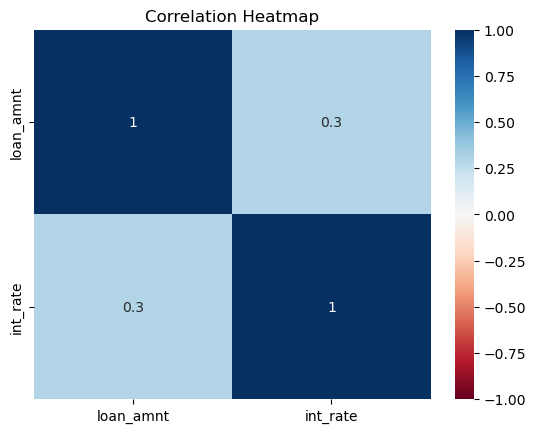

In [84]:
# Compute the correlation matrix - loan_amnt vs int_rate
corr_matrix_loan_int = loan_dataFrame[['loan_amnt', 'int_rate']].corr()
print(corr_matrix_loan_int)
# Plot the heatmap
sns.heatmap(corr_matrix_loan_int, annot=True, cmap='RdBu', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()


#### Inference: we can say that there is a moderate positive correlation between the loan amount and interest rate.As the loan amount increases, the interest rate tends to increase as well, but not very strongly.

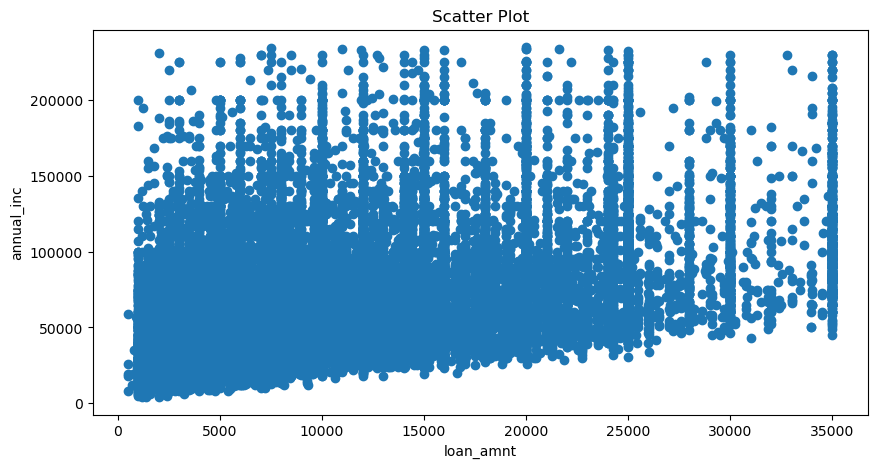

In [85]:
# Scatter plot using Matplotlib- loan_amnt vs annual_inc
plt.figure(figsize=(10,5))
plt.scatter(loan_dataFrame['loan_amnt'], loan_dataFrame['annual_inc'])
plt.xlabel('loan_amnt')
plt.ylabel('annual_inc')
plt.title('Scatter Plot')
plt.show()

            loan_amnt  annual_inc
loan_amnt    1.000000    0.414361
annual_inc   0.414361    1.000000


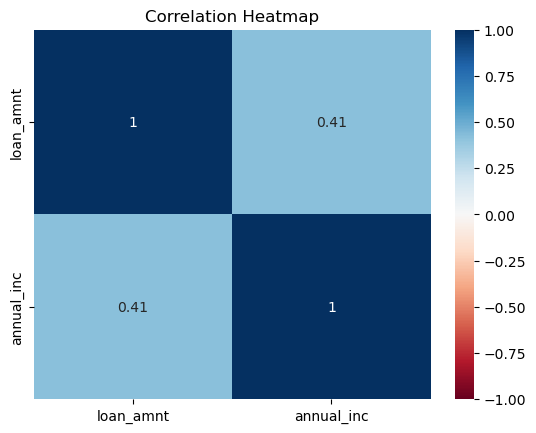

In [86]:
# Compute the correlation matrix - loan_amnt vs annual_inc
corr_matrix_loan_anninc = loan_dataFrame[['loan_amnt', 'annual_inc']].corr()
print(corr_matrix_loan_anninc)
# Plot the heatmap
sns.heatmap(corr_matrix_loan_anninc, annot=True, cmap='RdBu', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()


#### Inference: we can say that there is a moderate positive correlation between the loan amount and annual income. As the annual income increases, the loan amount tends to increase as well, but not very strongly.

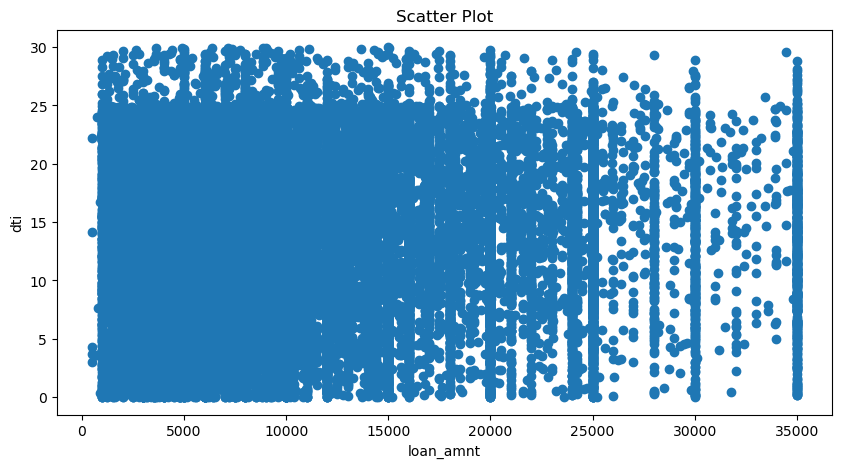

In [87]:
# Scatter plot using Matplotlib- loan_amnt vs dti
plt.figure(figsize=(10,5))
plt.scatter(loan_dataFrame['loan_amnt'], loan_dataFrame['dti'])
plt.xlabel('loan_amnt')
plt.ylabel('dti')
plt.title('Scatter Plot')
plt.show()

           loan_amnt       dti
loan_amnt   1.000000  0.071356
dti         0.071356  1.000000


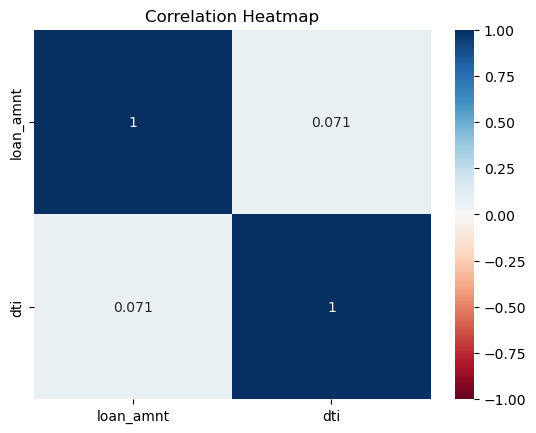

In [88]:
# Compute the correlation matrix - loan_amnt vs dti
corr_matrix_loan_dti = loan_dataFrame[['loan_amnt', 'dti']].corr()
print(corr_matrix_loan_dti)
# Plot the heatmap
sns.heatmap(corr_matrix_loan_dti, annot=True, cmap='RdBu', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()


#### Inference: we can say that this indicates a very weak positive correlation between the loan amount and the debt-to-income ratio.As the debt-to-income ratio increases, the loan amount does not show a strong tendency to increase or decrease.

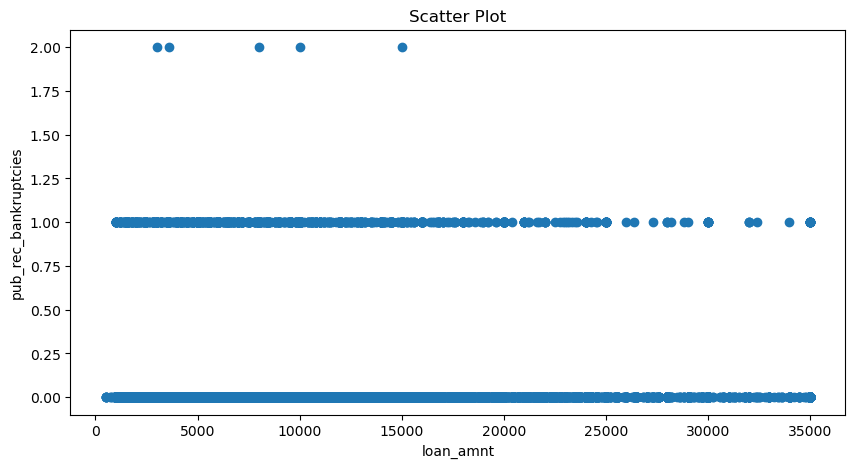

In [89]:
# Scatter plot using Matplotlib- loan_amnt vs pub_rec_bankruptcies
plt.figure(figsize=(10,5))
plt.scatter(loan_dataFrame['loan_amnt'], loan_dataFrame['pub_rec_bankruptcies'])
plt.xlabel('loan_amnt')
plt.ylabel('pub_rec_bankruptcies')
plt.title('Scatter Plot')
plt.show()

                      loan_amnt  pub_rec_bankruptcies
loan_amnt              1.000000             -0.033331
pub_rec_bankruptcies  -0.033331              1.000000


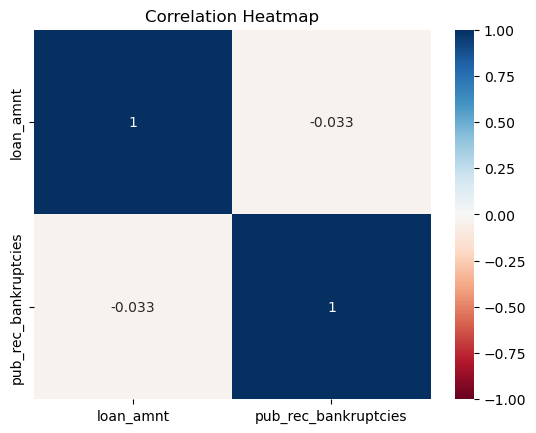

In [90]:
# Compute the correlation matrix - loan_amnt vs pub_rec_bankruptcies
corr_matrix_loan_pub_bank = loan_dataFrame[['loan_amnt', 'pub_rec_bankruptcies']].corr()
print(corr_matrix_loan_pub_bank)
# Plot the heatmap
sns.heatmap(corr_matrix_loan_pub_bank, annot=True, cmap='RdBu', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()


#### Inference: we can say that this indicates a very weak negative correlation between the loan amount and the number of public record bankruptcies. As the number of public record bankruptcies increases, the loan amount tends to decrease slightly, but the relationship is not strong.

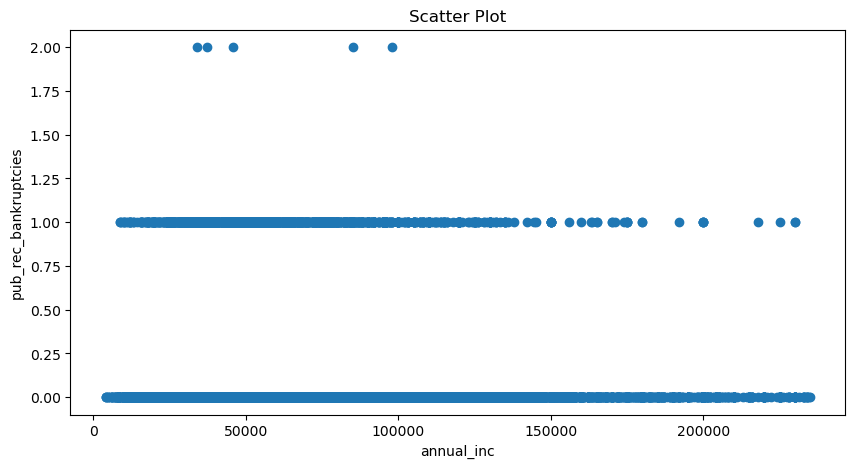

In [91]:
# Scatter plot using Matplotlib- annual_inc vs pub_rec_bankruptcies
plt.figure(figsize=(10,5))
plt.scatter(loan_dataFrame['annual_inc'], loan_dataFrame['pub_rec_bankruptcies'])
plt.xlabel('annual_inc')
plt.ylabel('pub_rec_bankruptcies')
plt.title('Scatter Plot')
plt.show()

                      annual_inc  pub_rec_bankruptcies
annual_inc              1.000000             -0.016855
pub_rec_bankruptcies   -0.016855              1.000000


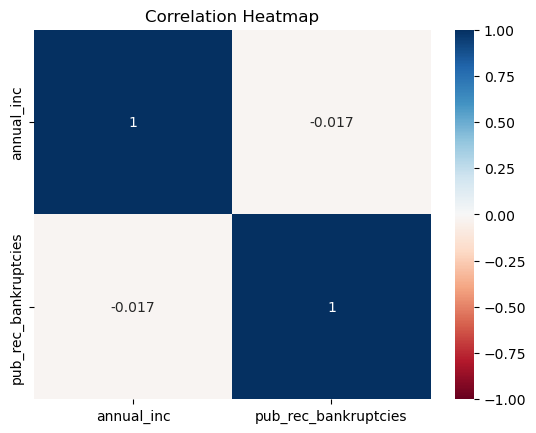

In [92]:
# Compute the correlation matrix - annual_inc vs pub_rec_bankruptcies
corr_matrix_anninc_pubbank = loan_dataFrame[['annual_inc', 'pub_rec_bankruptcies']].corr()
print(corr_matrix_anninc_pubbank)
# Plot the heatmap
sns.heatmap(corr_matrix_anninc_pubbank, annot=True, cmap='RdBu', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()

#### Inference: we can say that this indicates an extremely weak negative correlation between annual income and the number of public record bankruptcies.As the number of public record bankruptcies increases, the annual income tends to decrease slightly, but the relationship is almost negligible.

                      loan_amnt  funded_amnt      term  int_rate  installment  \
loan_amnt              1.000000     0.981782  0.348414  0.299918     0.931662   
funded_amnt            0.981782     1.000000  0.326775  0.304140     0.957544   
term                   0.348414     0.326775  1.000000  0.439858     0.090957   
int_rate               0.299918     0.304140  0.439858  1.000000     0.276542   
installment            0.931662     0.957544  0.090957  0.276542     1.000000   
emp_length             0.129200     0.128817  0.098349 -0.012137     0.101543   
annual_inc             0.414361     0.409941  0.072975  0.067725     0.411690   
dti                    0.071356     0.070906  0.077317  0.114169     0.061142   
inq_last_6mths         0.009534     0.009703  0.047634  0.133184     0.007569   
open_acc               0.173487     0.171726  0.045204  0.003547     0.168790   
revol_util             0.064080     0.067910  0.064843  0.467922     0.094509   
total_acc              0.249

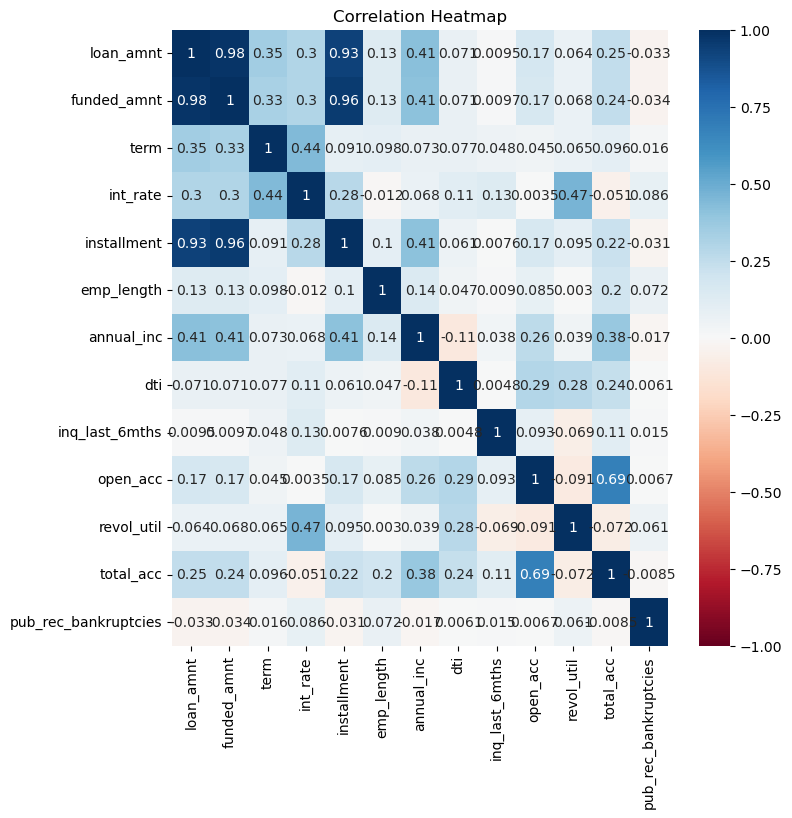

In [93]:
# Compute the correlation matrix for all numeric columns
corr_matrix_all_numeric_columns = loan_dataFrame[['loan_amnt', 'funded_amnt','term','int_rate','installment','emp_length','annual_inc','dti','inq_last_6mths', 'open_acc', 'revol_util', 'total_acc', 'pub_rec_bankruptcies']].corr()
print(corr_matrix_all_numeric_columns)
# Plot the heatmap
plt.figure(figsize=(8,8))
sns.heatmap(corr_matrix_all_numeric_columns, annot=True, cmap='RdBu', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()

### 5. Insights and observations:

#### Univariate Analysis
- More than 75% of the loans have been taken for 36 months compared to 60 months of term.
- The highest interest rate is more than 24% and minimum is just more than 5%. Most pople have taken loan at 12.5% and least at 25%.
- Most pople have taken loan at interest rate of 9%-13%.
- The "B" grade loans are highest with more than 30% and "G" lowest.
- Most loans are in "A" and "B" Sub grade but highest in "A4".
- Most of the borrowers have work experience greater than 10 years.
- Most of the borrowers are not owing house but on either mortage or rent.
- Most of the borrowers are in low income range of around 60k.
- More than 50% of the borrower's income or source is verified. But massive 43% are not verified.
- More than 50% of the loans were sanctioned in 2011. The loan approval increased every year.
- More than 85% loan were fully paid and around 15% Charged Off.
- More than 46% of the loans were for debt_consolidation.
- More than 18% of the borrowers are from CA which is highest.
- Most of the borrowers are in debt.
- Around 42% of the borrowers had recent credit inquiries.
- Many borrowers have open credit lines and 66% have between 2-10 credit line open.
- Most borrowers have 0 public record bankruptcies. 

#### Segmented Univariate Analysis
- we can say that Borrowers who take small_business loan have higher chance of defaulting.
- we can say that the 60 month term has higher chance of defaulti
- we can say that Grade F,D,G have higher chance of defaulting with G the highest.
- we can say that loans in dti range of 19-25 have higher chance of defaulting.
- we can see that Borrowers having pub_rec_bankruptcies are more likely to default.
- we can say that borrowers who are on RENT has higher chance of defaulting compared to Mortgage or own house.
- we can say that higher income borrowers are less likely to default and lower income borrowers with 50k and less are more likely to default.
- we can say that borrowers with High interest specifically above 17.5 are more likely to default.
- we can say that borrowers with experience of 10+ years are more likely to default and also repay.
- we can say that most defaults and Fully paid was in december month.
- we can say that most defaults and fullypaid was in year 2011.
- we can say that major borrowers are from CA, FL and NY.
- we can say that large amount of loan has higher chance of defaulting.

#### Bivariate Analysis

- we can say that there is a moderate positive correlation between the loan amount and interest rate. As the loan amount increases, the interest rate tends to increase as well, but not very strongly.

- we can say that there is a moderate positive correlation between the loan amount and annual income. As the annual income increases, the loan amount tends to increase as well, but not very strongly.
  
- we can say that this indicates a very weak positive correlation between the loan amount and the debt-to-income ratio.As the debt-to-income ratio increases, the loan amount does not show a strong tendency to increase or decrease.

- we can say that this indicates a very weak negative correlation between the loan amount and the number of public record bankruptcies. As the number of public record bankruptcies increases, the loan amount tends to decrease slightly, but the relationship is not strong.
  
- we can say that this indicates an extremely weak negative correlation between annual income and the number of public record bankruptcies.As the number of public record bankruptcies increases, the annual income tends to decrease slightly, but the relationship is almost negligible

#### Recommendations:

- Major Driver variables which are strong indicators of default are:

    1. int_rate (Intrest rate)
    2. emp_length (Employment length)
    3. grade (loan grade)
    4. purpose (loan purpose)
    5. dti (Debt-to-Income Ratio)
    6. Pub_rec_bankruptcies (public record bankruptcies)
    7. annual_inc (Annual income)

- Details on the above variables and other aspects:
    - we can say that Borrowers with 60 month term loan has higher chance of defaulting.
    - we can say that Borrowers with loan Grade F,D,G have higher chance of defaulting with G the highest.
    - we can say that Borrowers who take small_business loan have higher chance of defaulting.
    - we can say that Borrowers with Public Recorded Bankruptcy has higher chance of defaulting.
    - we can say that borrowers with experience of 10+ years are more likely to default.
    - we can say that Borrowers with High interest specifically above 17.5 are more likely to default.
    - we can say that Borrowers loans in dti range of 19-25 have higher chance of defaulting.
    - we can say that Borrowers who are on RENT has higher chance of defaulting compared to Mortgage or own house.
    - we can say that Borrowers with working experience 10+ years has higher chance of defaulting.